# DATA

In [2]:
import pandas as pd
from IPython.display import display, Markdown
from langdetect import detect, DetectorFactory
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import squarify
from pywaffle import Waffle
from matplotlib.ticker import FuncFormatter
import plotly.graph_objects as go
import matplotlib.dates as mdates
import plotly.graph_objects as go
import os

In [3]:
df = pd.read_excel('../data/kyrgyzstan_coal_dataset.xlsx')

In [4]:
# 1. Print dataset shape (rows, columns)
print(f"\033[1mDataset shape:\033[0m {df.shape[0]} rows × {df.shape[1]} columns")

# 2. List all column names
print("\033[1mColumns:\033[0m")
print(df.columns.tolist())

# 3. Show example rows from beginning and end
print("\n\033[1mSample rows from the top of the dataset:\033[0m")
print(df.head(5))

print("\n\033[1mSample rows from the bottom of the dataset:\033[0m")
print(df.tail(5))

# 4. Show data types for each column
print("\n\033[1mColumn data types:\033[0m")
print(df.dtypes)

Dataset shape: 3046 rows × 20 columns
Columns:
['post_url', 'post_text', 'post_label', 'number_of_likes', 'number_of_shares', 'number_of_comments', 'post_date', 'comment_text', 'comment_date', 'comment_reactions_count', 'comment_mode_types', 'post_target_region', 'post_language', 'comment_language', 'coal_topic/event_tag', 'season', 'comment_sentiment_label', 'sentiment_confidence', 'news_page_name', 'notes']

Sample rows from the top of the dataset:
                                            post_url  \
0  https://www.facebook.com/AzattykPlus/posts/252...   
1  https://www.facebook.com/AzattykPlus/posts/283...   
2  https://www.facebook.com/AzattykPlus/posts/214...   
3  https://www.facebook.com/AliToktakunov/posts/1...   
4  https://www.facebook.com/groups/araba.kg/perma...   

                                           post_text post_label  \
0       Электр жетишсиз, көмүр кымбат - өкмөт келсин   negative   
1        ТҮШТҮКТӨ КӨМҮРДҮН ТОННАСЫ 7 МИҢ СОМГО ЧЫКТЫ   negative   
2  Кызы

# Data Cleaning

### Standardizing column names

In [5]:
# Rename columns to a standardized format (lowercase, underscores)
df.rename(columns={
    'Post URL': 'post_url',
    'Post Text': 'post_text',
    'Post Label': 'post_label',
    'Number of Likes': 'post_likes',
    'Number of Shares': 'post_shares',
    'Number of Comments': 'post_comments_count',
    'Post Date': 'post_date',
    'Comment Text': 'comment_text',
    'Comment Date': 'comment_date',
    'Comment Reactions Count': 'comment_reactions',
    'Comment mode Types': 'comment_mode',
    'Post target region': 'post_region',
    'Post Language': 'post_language',
    'Comment language': 'comment_language',
    'Coal Topic/Event Tag': 'coal_topic',
    'Season': 'season',
    'Comment Sentiment Label': 'comment_sentiment',
    'Sentiment Confidence': 'sentiment_confidence',
    'News Page Name': 'news_page',
    'Notes': 'notes'
}, inplace=True)
print("\033[1mColumns:\033[0m")
print(df.columns.tolist())

Columns:
['post_url', 'post_text', 'post_label', 'number_of_likes', 'number_of_shares', 'number_of_comments', 'post_date', 'comment_text', 'comment_date', 'comment_reactions_count', 'comment_mode_types', 'post_target_region', 'post_language', 'comment_language', 'coal_topic/event_tag', 'season', 'comment_sentiment_label', 'sentiment_confidence', 'news_page_name', 'notes']


### Cleaning duplicates

In [6]:
# Step 1: Detect duplicates based on both 'post_text' and 'comment_text'
duplicate_mask = df.duplicated(subset=['post_text', 'comment_text'], keep=False)
duplicate_rows = df[duplicate_mask]

# Show duplicate rows if any
duplicate_count = len(duplicate_rows)
display(Markdown(f"🔍 **Total rows with duplicate Post + Comment text:** {duplicate_count}"))
if duplicate_count > 0:
    display(duplicate_rows.head(20))  # Show only the first few for preview

# Step 2: Drop duplicates based on both 'post_text' and 'comment_text'
original_count = len(df)
df = df.drop_duplicates(subset=['post_text', 'comment_text'])
cleaned_count = len(df)

# Step 3: Show how many were removed
removed_count = original_count - cleaned_count
display(Markdown(f"🧹 **Duplicates removed:** {removed_count}"))
display(Markdown(f"✅ **Remaining rows after deduplication:** {cleaned_count}"))


🔍 **Total rows with duplicate Post + Comment text:** 238

,post_url,post_text,post_label,number_of_likes,number_of_shares,number_of_comments,post_date,comment_text,comment_date,comment_reactions_count,comment_mode_types,post_target_region,post_language,comment_language,coal_topic/event_tag,season,comment_sentiment_label,sentiment_confidence,news_page_name,notes
30,https://www.facebook.com/share/1FKy21TWWa/,"""Шахтадагы балалык. Кечээ дүйнөдө Жакырчылыкты...",negative,3,0,4,2012-10-18 00:00:00,:(,2012-10-19 00:00:00,0.0,emoji,Batken,Kyrgyz,Kyrgyz,child labor,fall,negative,high,Azattyk,NaN
84,https://www.facebook.com/share/1FKy21TWWa/,"""Шахтадагы балалык. Кечээ дүйнөдө Жакырчылыкты...",negative,3,0,4,2012-10-18 00:00:00,:(,2012-10-19 00:00:00,0.0,emoji,Batken,Kyrgyz,Kyrgyz,child labor,fall,negative,high,Azattyk,NaN
269,https://www.facebook.com/azattyk.org/posts/826...,Кара-Кече көмүр кенинин коопсуздук кызматынын ...,negative,79,29,7,2016-02-05 00:00:00,:(,2016-02-05 00:00:00,3.0,emoji,Naryn,Kyrgyz,Kyrgyz,criminals,winter,negative,high,Kyrgyz Azattyk Unalgysy,NaN
291,https://www.facebook.com/kgKabar/posts/pfbid07...,Бишкек мэриясы аз камсыз болгон үй-бүлөлөргө о...,positive,18,1,0,2016-10-14 00:00:00,NaN,NaN,NaN,NaN,Bishkek,Kyrgyz,NaN,government supply,fall,NaN,NaN,Kabar KG,NaN
308,https://www.facebook.com/azattyk.org/posts/826...,Кара-Кече көмүр кенинин коопсуздук кызматынын ...,negative,79,29,7,2016-02-05 00:00:00,:(,2016-02-05 00:00:00,3.0,emoji,Naryn,Kyrgyz,Kyrgyz,criminals,winter,negative,high,Kyrgyz Azattyk Unalgysy,NaN
1184,https://www.facebook.com/Elimbarsynby.osh/post...,"Достор!! ""Жылуулук тартуулаңыз"" муктаждарга кө...",negative,7,0,0,04/15/2012,NaN,04/15/2012,NaN,NaN,Osh,Kyrgyz,NaN,scarcity,fall,NaN,NaN,Элим барсынбы?- Ош кайрымдуулук фонду.,NaN
1198,https://www.facebook.com/watch/?v=427496091303...,Бул Бишкек шаарынын Ленин районундагы көмүр к...,negative,3,3,0,03/07/2021,NaN,03/07/2021,NaN,NaN,Bishkek,Kyrgyz,NaN,natural disaster,fall,NaN,NaN,"ГП ""Кыргызкомур""",NaN
1208,https://www.facebook.com/watch/?v=134084890637...,Көмүр. чыккан Нарында отун тартыш Кара-Кече ке...,negative,897,154,222,02/16/2012,"Жайында чалкалап жатсанар, кышында тырмалайсы...",02/16/2012,14.0,text,Naryn,Kyrgyz,Kyrgyz,winter preparation,fall,negative,high,Kyrgyz Azattyk Unalgysy,NaN
1225,https://www.facebook.com/watch/?v=427496091303...,Бул Бишкек шаарынын Ленин районундагы көмүр к...,negative,3,3,0,07/27/2023,NaN,07/27/2023,NaN,NaN,Bishkek,Kyrgyz,NaN,government visit,fall,NaN,NaN,"ГП ""Кыргызкомур""",NaN
1244,https://www.facebook.com/1Radiokg/posts/511125...,Баткенде көмүр кымбат,neutral,0,0,0,05/24/2020,NaN,05/24/2020,NaN,NaN,Batken,Kyrgyz,NaN,corruption,summer,NaN,NaN,БИРИНЧИ РАДИО,NaN


🧹 **Duplicates removed:** 122

✅ **Remaining rows after deduplication:** 2924

### Handling missing values

In [7]:
# Show number of missing values per column
missing_values = df.isnull().sum().sort_values(ascending=False)

display(Markdown("**Missing values per column:**"))
print(missing_values)

**Missing values per column:**

notes                      2924
comment_reactions_count     627
sentiment_confidence        604
comment_sentiment_label     604
comment_text                599
comment_mode_types          598
comment_language            572
comment_date                228
post_date                     0
number_of_comments            0
number_of_shares              0
post_text                     0
post_target_region            0
post_language                 0
coal_topic/event_tag          0
season                        0
number_of_likes               0
post_label                    0
news_page_name                0
post_url                      0
dtype: int64


In [8]:
# Fix randomness in langdetect
DetectorFactory.seed = 0

# Track initial row count
initial_row_count = len(df)

# ----------------- Fill missing comment sentiment confidence -----------------

# Only fill sentiment_confidence where comment exists and it's missing
mask_conf = df['comment_text'].notnull() & df['sentiment_confidence'].isnull()

# Calculate mode (most frequent value)
mode_conf = df.loc[df['comment_text'].notnull(), 'sentiment_confidence'].mode()
fill_value = mode_conf[0] if not mode_conf.empty else 'medium'  # Default fallback if no mode

rows_conf_filled = mask_conf.sum()
df.loc[mask_conf, 'sentiment_confidence'] = fill_value

display(Markdown(f"✅ **Filled `sentiment_confidence` for {rows_conf_filled} rows with mode: '{fill_value}'.**"))


# ----------------- Fill missing sentiment labels -----------------
mask_sent = df['comment_text'].notnull() & df['comment_sentiment_label'].isnull()
rows_sent_filled = mask_sent.sum()
df.loc[mask_sent, 'comment_sentiment_label'] = 'neutral'
display(Markdown(f"✅ **Filled `comment_sentiment_label` for `{rows_sent_filled}` rows with 'neutral'.**"))

# ----------------- Fill missing comment dates with post dates -----------------
df['post_date'] = pd.to_datetime(df['post_date'], errors='coerce')
df['comment_date'] = pd.to_datetime(df['comment_date'], errors='coerce')
mask_cdate = df['comment_text'].notnull() & df['comment_date'].isnull()
rows_cdate_filled = mask_cdate.sum()
df.loc[mask_cdate, 'comment_date'] = df.loc[mask_cdate, 'post_date']
display(Markdown(f"✅ **Filled `comment_date` for `{rows_cdate_filled}` rows using corresponding `post_date`.**"))

# ----------------- Detect missing comment languages -----------------
def detect_lang(text):
    try:
        return detect(text)
    except:
        return 'unknown'

mask_clang = df['comment_text'].notnull() & df['comment_language'].isnull()
rows_clang_detected = mask_clang.sum()
df.loc[mask_clang, 'comment_language'] = df.loc[mask_clang, 'comment_text'].apply(detect_lang)
display(Markdown(f"✅ **Detected `comment_language` for `{rows_clang_detected}` rows.**"))

# ----------------- Fill missing comment_mode_types -----------------
mask_mode = df['comment_text'].notnull() & df['comment_mode_types'].isnull()
rows_mode_filled = mask_mode.sum()
df.loc[mask_mode, 'comment_mode_types'] = 'text'
display(Markdown(f"✅ **Filled `comment_mode_types` for `{rows_mode_filled}` rows with 'text'.**"))


✅ **Filled `sentiment_confidence` for 5 rows with mode: 'high'.**

✅ **Filled `comment_sentiment_label` for `5` rows with 'neutral'.**

✅ **Filled `comment_date` for `0` rows using corresponding `post_date`.**

✅ **Detected `comment_language` for `0` rows.**

✅ **Filled `comment_mode_types` for `0` rows with 'text'.**

### Formatting Dates

In [9]:
# check date formats
for col in ['post_date', 'comment_date']:
    if col in df.columns:
        df[col] = pd.to_datetime(df[col], errors='coerce')

invalid_post_dates = df['post_date'].isnull().sum()
invalid_comment_dates = df['comment_date'].isnull().sum()

#Convert to datetime if not already
df['post_date'] = pd.to_datetime(df['post_date'], errors='coerce')
df['comment_date'] = pd.to_datetime(df['comment_date'], errors='coerce')

# Count non-null values before conversion
post_date_count = df['post_date'].notnull().sum()
comment_date_count = df['comment_date'].notnull().sum()

# Strip time portion, keep only date
df['post_date'] = df['post_date'].dt.date
df['comment_date'] = df['comment_date'].dt.date

# Confirm changes
display(Markdown(f"📅 **Formatted `post_date` for {post_date_count:,} rows (removed time).**"))
display(Markdown(f"📅 **Formatted `comment_date` for {comment_date_count:,} rows (removed time).**"))

📅 **Formatted `post_date` for 2,924 rows (removed time).**

📅 **Formatted `comment_date` for 2,696 rows (removed time).**

### Removing orphaned comment language

In [10]:
# Identify rows where comment is missing but comment_language is present
mask_orphan_lang = df['comment_text'].isnull() & df['comment_language'].notnull()

# Count how many such rows exist
rows_orphan_lang = mask_orphan_lang.sum()

# Remove the language info (set to NaN)
df.loc[mask_orphan_lang, 'comment_language'] = np.nan

# Print how many were fixed
display(Markdown(f"🧹 **Cleared `comment_language` in {rows_orphan_lang} rows with no actual comment.**"))

🧹 **Cleared `comment_language` in 27 rows with no actual comment.**

### Data Sanity Check

In [11]:
#Ensure number_of_likes, number_of_comments, number_of_shares are integers (not floats or strings)
print(df.dtypes)

#Review category-type columns to spot typos or variations
for col in ['season', 'post_label', 'comment_sentiment_label', 'post_language', 'comment_language']:
    print(f"{col}:", df[col].dropna().unique())


post_url                    object
post_text                   object
post_label                  object
number_of_likes              int64
number_of_shares             int64
number_of_comments           int64
post_date                   object
comment_text                object
comment_date                object
comment_reactions_count    float64
comment_mode_types          object
post_target_region          object
post_language               object
comment_language            object
coal_topic/event_tag        object
season                      object
comment_sentiment_label     object
sentiment_confidence        object
news_page_name              object
notes                      float64
dtype: object
season: ['fall' 'summer' 'winter' 'spring']
post_label: ['negative' 'neutral' 'unknown' 'positive']
comment_sentiment_label: ['negative' 'neutral' 'positive' 'nutral' 'unknown']
post_language: ['Kyrgyz' 'Kyrgyz, other' 'Russian' 'kyrgyz' 'Kyrgyz, Russian']
comment_language: ['Kyrgyz' '

In [12]:
# Convert data types
df['post_date'] = pd.to_datetime(df['post_date'], errors='coerce')
df['comment_date'] = pd.to_datetime(df['comment_date'], errors='coerce')

# Clean typos and categories
df['comment_sentiment_label'] = df['comment_sentiment_label'].replace('nutral', 'neutral')
df['post_language'] = df['post_language'].str.strip().str.capitalize()
df['comment_language'] = df['comment_language'].replace(0, 'unknown')

# Drop unused
df = df.drop(columns=['notes'], errors='ignore')

#  DATA ANALYSIS

## 1.Temporal Patterns

### 1.1.Number of Posts per Season Each Year

In [13]:
df = pd.read_csv('../data/kyrgyz_coal_dataset_cleaned.csv')

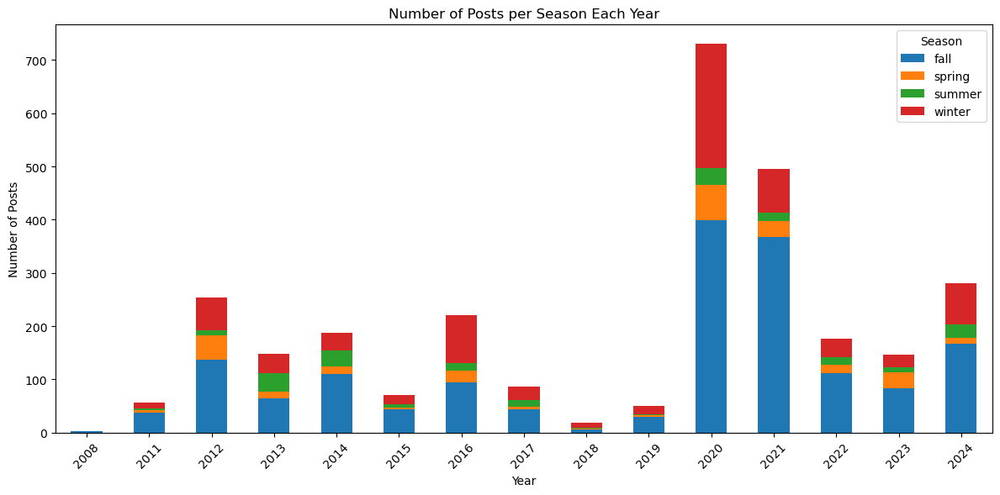

In [14]:
# Extract year from post date
df["post_year"] = pd.to_datetime(df["post_date"], errors="coerce").dt.year

# Group by year and season to count posts
seasonal_post_counts = df.groupby(["post_year", "season"]).size().unstack()

# Plot
seasonal_post_counts.plot(kind="bar", stacked=True, figsize=(12, 6))
plt.title("Number of Posts per Season Each Year")
plt.xlabel("Year")
plt.ylabel("Number of Posts")
plt.xticks(rotation=45)
plt.legend(title="Season")
plt.tight_layout()
plt.show()

### 1.2.Dominant Coal Topics per Season

In [15]:
# Create a copy of the dataframe for topic analysis
df_topic_expanded = df.copy()

# Step 1: Split multiple tags (e.g., "corruption, scarcity") into lists
df_topic_expanded["coal_topic/event_tag"] = df_topic_expanded["coal_topic/event_tag"].str.split(',')

# Step 2: Remove extra whitespace around each tag
df_topic_expanded["coal_topic/event_tag"] = df_topic_expanded["coal_topic/event_tag"].apply(lambda tags: [t.strip() for t in tags])

# Step 3: Explode the list into multiple rows
df_topic_expanded = df_topic_expanded.explode("coal_topic/event_tag")

# Optional: Confirm the change
print("✅ Rows after explosion:", len(df_topic_expanded))
print("🔍 Unique tags:", df_topic_expanded["coal_topic/event_tag"].nunique())

✅ Rows after explosion: 3931
🔍 Unique tags: 60


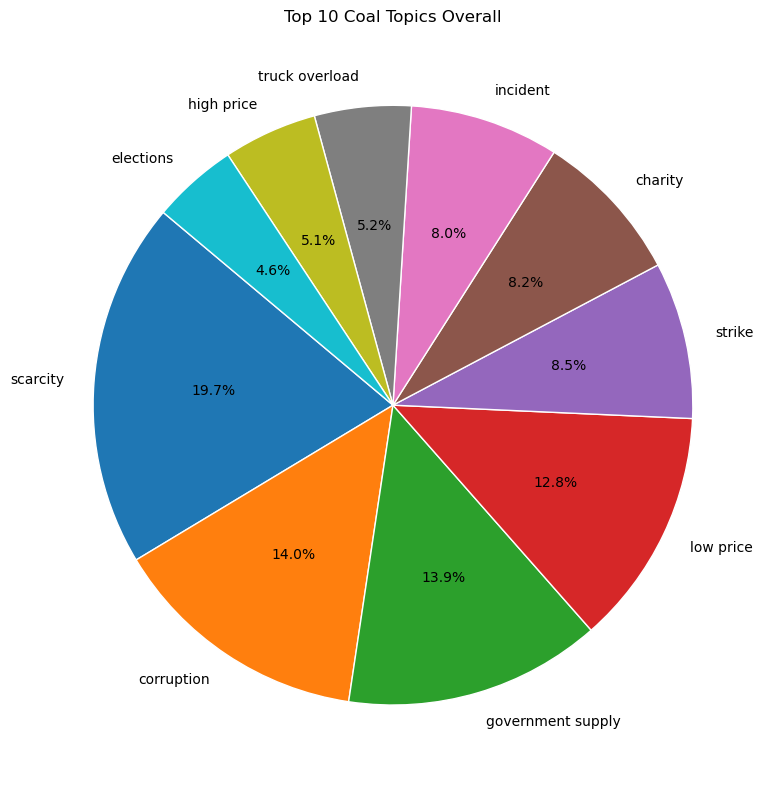

In [16]:
# Recalculate topic order based on total frequency
top_10_topics = (
    df_topic_expanded["coal_topic/event_tag"]
    .value_counts()
    .nlargest(10)
)

# Plot a pie chart of the top 10 topics
plt.figure(figsize=(8, 8))
plt.pie(
    top_10_topics.values,
    labels=top_10_topics.index,
    autopct="%1.1f%%",
    startangle=140,
    wedgeprops={"edgecolor": "white"}
)

plt.title("Top 10 Coal Topics Overall")
plt.tight_layout()
plt.show()

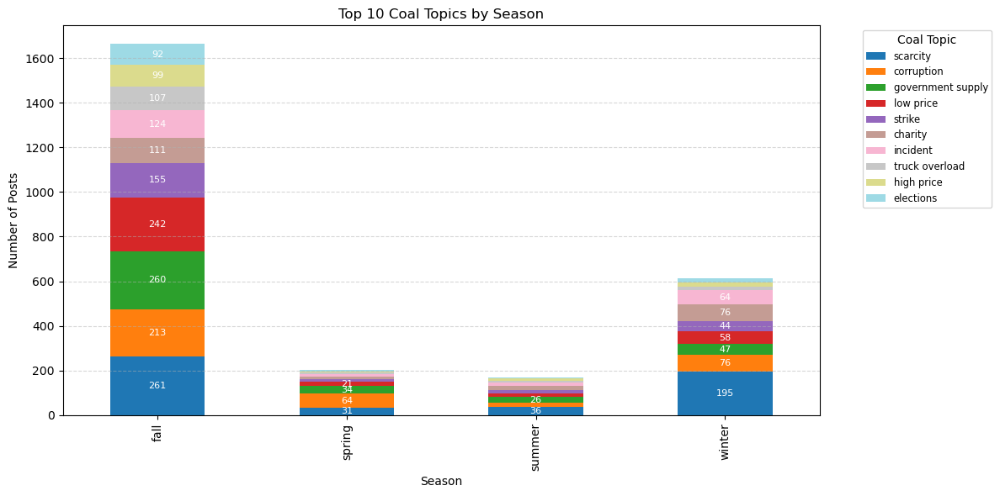

In [17]:
# Step 1: Identify top 10 most frequent coal topics
top_topics = df_topic_expanded['coal_topic/event_tag'].value_counts().nlargest(10).index.tolist()

# Step 2: Filter only rows with these top topics
df_top_topics = df_topic_expanded[df_topic_expanded['coal_topic/event_tag'].isin(top_topics)]

# Step 3: Group by season and topic, and count
top_topic_season_counts = (
    df_top_topics.groupby(['season', 'coal_topic/event_tag'])
    .size()
    .unstack()
    .fillna(0)
    .astype(int)
)

# Optional: sort columns by total frequency for visual clarity
sorted_columns = df_top_topics['coal_topic/event_tag'].value_counts().loc[top_topics].index.tolist()
top_topic_season_counts = top_topic_season_counts[sorted_columns]

# Plot stacked bar
ax = top_topic_season_counts.plot(
    kind="bar", figsize=(12, 6), stacked=True, colormap="tab20"
)
plt.title("Top 10 Coal Topics by Season")
plt.xlabel("Season")
plt.ylabel("Number of Posts")
plt.legend(title="Coal Topic", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize="small")
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Only show label if the bar height is large enough (e.g. >20)
for container in ax.containers:
    labels = [f"{int(v)}" if v > 20 else "" for v in container.datavalues]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=8, color="white")

plt.tight_layout()
plt.show()

### 1.3.Post Sentiment Distribution per Season

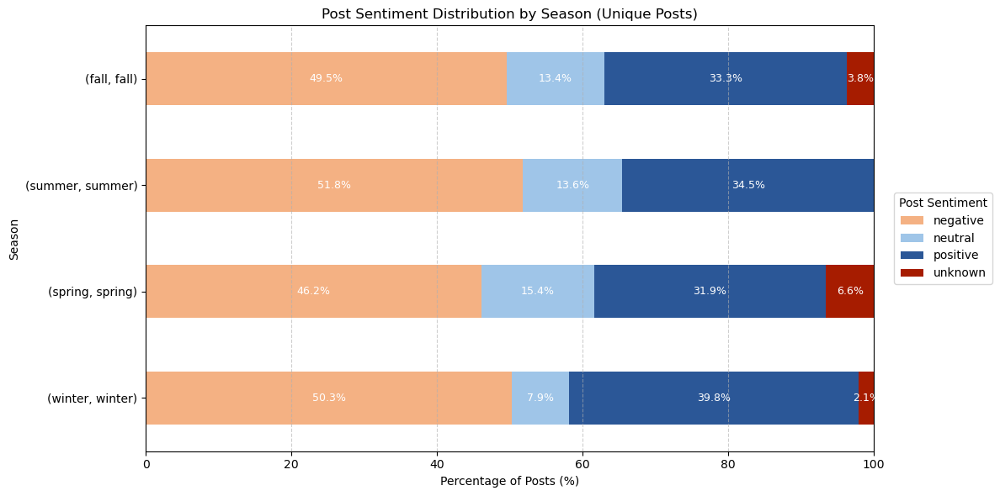

In [18]:
# Step 1: Filter for unique posts using 'post_url'
unique_posts = df.drop_duplicates(subset="post_url")

# Step 2: Group by season and post sentiment
post_season_sentiment = (
    unique_posts.groupby(["season", "post_label"]).size()
    .groupby(level=0)
    .apply(lambda x: 100 * x / float(x.sum()))
    .unstack()
    .fillna(0)
)

# Step 3: Sort seasons chronologically
season_order = ["winter", "spring", "summer", "fall"]
post_season_sentiment = post_season_sentiment.loc[season_order]

# Step 4: Plot as stacked horizontal bar chart with percentage labels
colors = {
    "positive": "#2b5797",
    "neutral": "#9fc5e8",
    "negative": "#f4b183",
    "unknown": "#a61c00"
}

ax = post_season_sentiment.plot(
    kind="barh",
    stacked=True,
    figsize=(12, 6),
    color=[colors.get(col, "#cccccc") for col in post_season_sentiment.columns]
)

plt.title("Post Sentiment Distribution by Season (Unique Posts)")
plt.xlabel("Percentage of Posts (%)")
plt.ylabel("Season")
plt.xlim(0, 100)
plt.grid(axis="x", linestyle="--", alpha=0.6)

# Add percentage labels inside bars
for i, season in enumerate(post_season_sentiment.index):
    left = 0
    for sentiment in post_season_sentiment.columns:
        value = post_season_sentiment.loc[season, sentiment]
        if value > 2:  # only label if large enough
            ax.text(left + value / 2, i, f"{value:.1f}%", ha="center", va="center", color="white", fontsize=9)
        left += value

# Add legend
plt.legend(
    title="Post Sentiment",
    bbox_to_anchor=(1.02, 0.5),
    loc="center left"
)

plt.tight_layout()
plt.show()

### 1.4.Comment Sentiment Distribution per Season

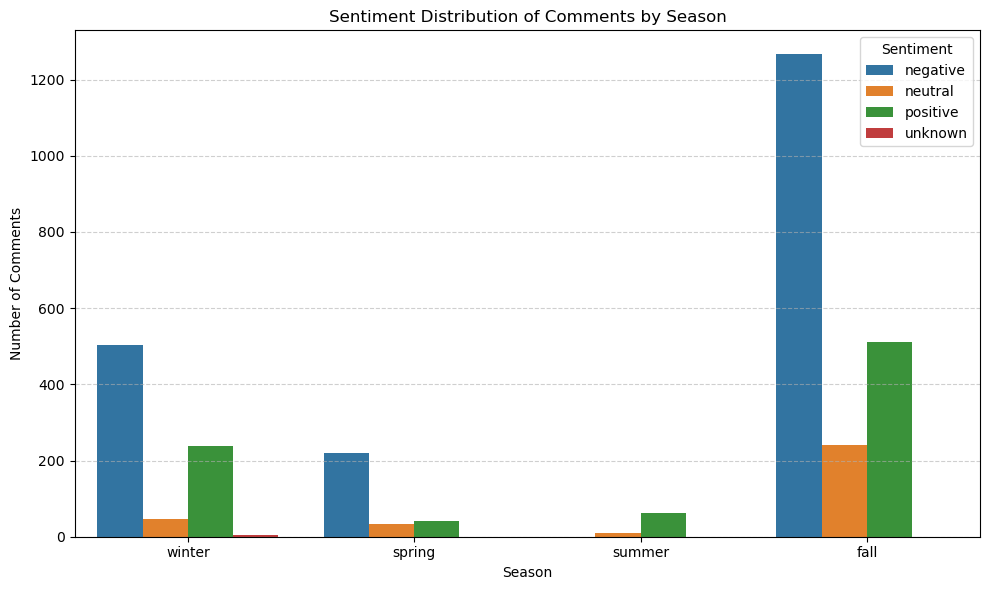

In [20]:
# Aggregate counts
grouped = (
    df_topic_expanded.groupby(["season", "comment_sentiment_label"])
    .size()
    .reset_index(name="count")
)

# Set order for seasons if needed
season_order = ["winter", "spring", "summer", "fall"]
sentiment_order = grouped["comment_sentiment_label"].unique()

# Plot grouped bar chart
plt.figure(figsize=(10, 6))
sns.barplot(
    data=grouped,
    x="season",
    y="count",
    hue="comment_sentiment_label",
    order=season_order,
    hue_order=sentiment_order
)

plt.title("Sentiment Distribution of Comments by Season")
plt.xlabel("Season")
plt.ylabel("Number of Comments")
plt.legend(title="Sentiment")
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

### 1.5.Seasonal Sentiment Trends Over Years

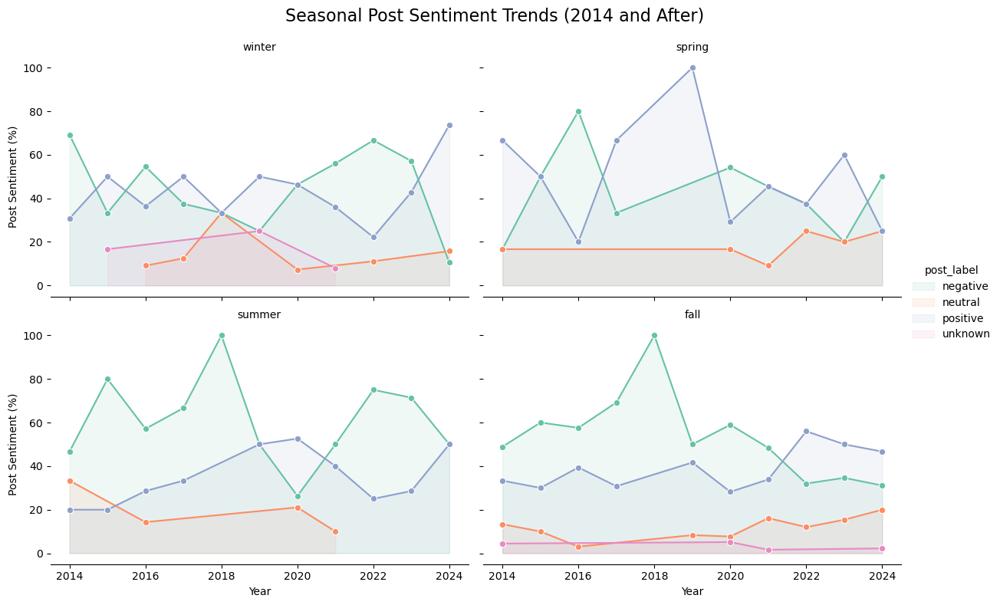

In [21]:
# STEP 1: Extract year from post_date
df['year'] = pd.to_datetime(df['post_date'], errors='coerce').dt.year

# ✅ Filter out rows before 2014
df = df[df['year'] >= 2014]

# STEP 2: Group by season, year, and sentiment
seasonal_sentiment = (
    df.drop_duplicates(subset='post_url')  # Ensure unique posts
      .groupby(['season', 'year', 'post_label'])
      .size()
      .reset_index(name='count')
)

# STEP 3: Calculate percentage per year-season
seasonal_sentiment['total'] = seasonal_sentiment.groupby(['season', 'year'])['count'].transform('sum')
seasonal_sentiment['percentage'] = (seasonal_sentiment['count'] / seasonal_sentiment['total']) * 100

# STEP 4: Sort season order
season_order = ['winter', 'spring', 'summer', 'fall']
seasonal_sentiment['season'] = pd.Categorical(seasonal_sentiment['season'], categories=season_order, ordered=True)

# STEP 5: Plot using seaborn FacetGrid
g = sns.FacetGrid(
    seasonal_sentiment, 
    col="season", 
    hue="post_label", 
    col_order=season_order, 
    col_wrap=2,
    height=4, 
    aspect=1.5, 
    palette="Set2"
)

g.map(sns.lineplot, "year", "percentage", marker="o")
g.map(plt.fill_between, "year", "percentage", alpha=0.1).add_legend()

# Add title and axis labels
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Year", "Post Sentiment (%)")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Seasonal Post Sentiment Trends (2014 and After)", fontsize=16)
g.set(yticks=range(0, 101, 20))
g.set_titles("{col_name}")
g.despine(left=True)
plt.show()

### 1.6.Average Reactions by Season

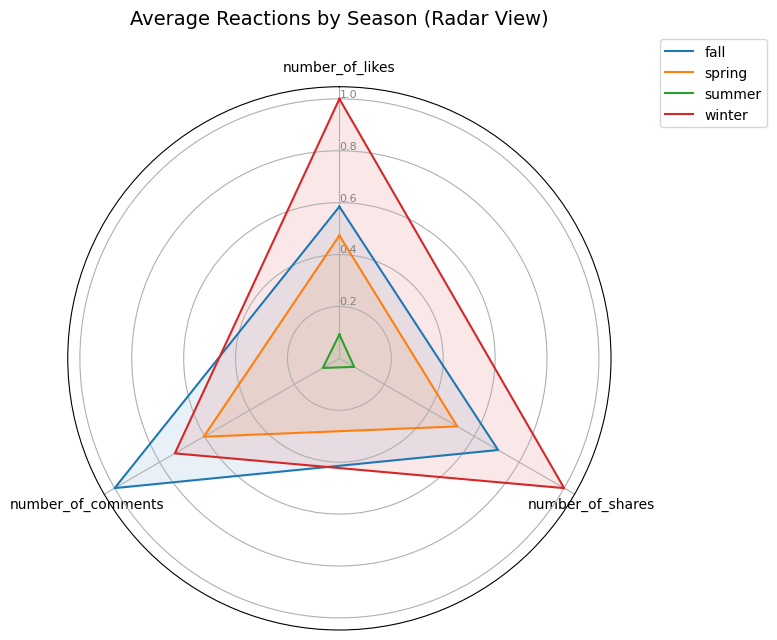

In [22]:
from math import pi

# Step 1: Prepare data
# Get average reactions for unique posts per season
unique_posts = df.drop_duplicates(subset="post_url")
avg_reactions = unique_posts.groupby("season")[["number_of_likes", "number_of_shares", "number_of_comments"]].mean()

# Normalize values between 0 and 1 (so all seasons are compared on the same scale)
normalized = avg_reactions / avg_reactions.max()

# Reindex seasons to follow order
avg_reactions = avg_reactions.reindex(["winter", "spring", "summer", "fall"])

# Step 2: Convert for radar chart format
categories = avg_reactions.columns.tolist()
num_vars = len(categories)

# Angle setup
angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
angles += angles[:1]  # close the loop

# Step 3: Create Radar plot
plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)

# Plot each season's data
for season in normalized.index:
    values = normalized.loc[season].tolist()
    values += values[:1]  # close the loop
    ax.plot(angles, values, label=season)
    ax.fill(angles, values, alpha=0.1)


# Formatting
ax.set_theta_offset(pi / 2)
ax.set_theta_direction(-1)

plt.xticks(angles[:-1], categories, fontsize=10)
ax.set_rlabel_position(0)
plt.yticks(color="gray", size=8)
plt.title("Average Reactions by Season (Radar View)", size=14, y=1.1)
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.tight_layout()
plt.show()

## 2. Sentiment Disribution

### 2.1.Post Sentiment Distribution

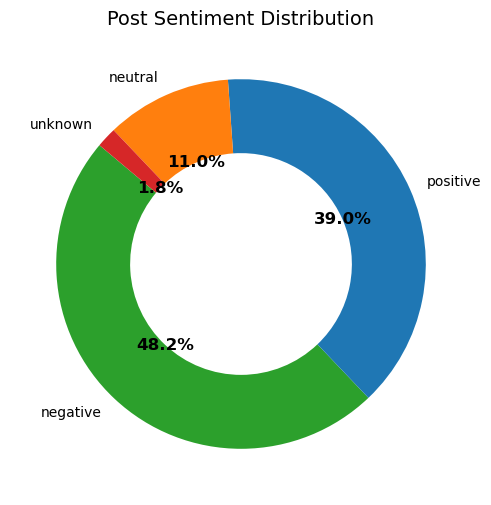

,Count,Percentage
post_label,,
negative,325,48.22
positive,263,39.02
neutral,74,10.98
unknown,12,1.78


In [23]:
# Filter to only unique posts based on post_url
unique_posts = df.drop_duplicates(subset="post_url")

# Count post sentiments
post_sentiment_counts = unique_posts["post_label"].value_counts().sort_values(ascending=False)

# Calculate percentages
post_sentiment_percent = (post_sentiment_counts / post_sentiment_counts.sum()) * 100

# Plot donut chart
colors = ["#2ca02c", "#1f77b4", "#ff7f0e", "#d62728"]  # green, blue, orange, red
fig, ax = plt.subplots(figsize=(6, 6))
wedges, texts, autotexts = ax.pie(
    post_sentiment_counts,
    labels=post_sentiment_counts.index,
    autopct="%1.1f%%",
    startangle=140,
    colors=colors,
    wedgeprops=dict(width=0.4)
)

plt.setp(autotexts, size=12, weight="bold")
ax.set_title("Post Sentiment Distribution", fontsize=14)
plt.show()

# Show table with counts and percentages
post_summary = pd.DataFrame({
    "Count": post_sentiment_counts,
    "Percentage": post_sentiment_percent.round(2)
})
display(post_summary)

### 2.2.Comment Sentiment Distribution

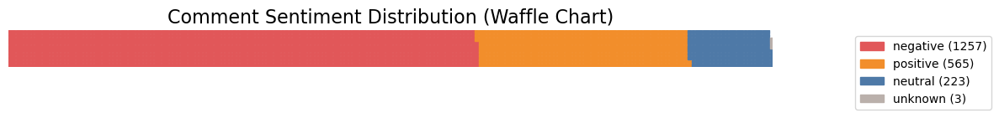

In [24]:
# Filter out missing or empty comments
df_comments = df[df['comment_text'].notnull()]

# Count sentiment labels
sentiment_counts = df_comments['comment_sentiment_label'].value_counts().to_dict()

# Plot waffle chart
fig = plt.figure(
    FigureClass=Waffle, 
    rows=10,  # Instead of 5
    values=sentiment_counts,
    colors=["#e15759", "#f28e2b", "#4e79a7", "#bab0ab"],
    title={'label': 'Comment Sentiment Distribution (Waffle Chart)', 'loc': 'center', 'fontsize': 16},
    labels=[f"{k} ({v})" for k, v in sentiment_counts.items()],
    legend={'loc': 'upper left', 'bbox_to_anchor': (1.1, 1), 'fontsize': 10},
    figsize=(12, 6)
)

plt.tight_layout()
plt.show()

### 2.3.Sentiment by Coal Issues / Topics

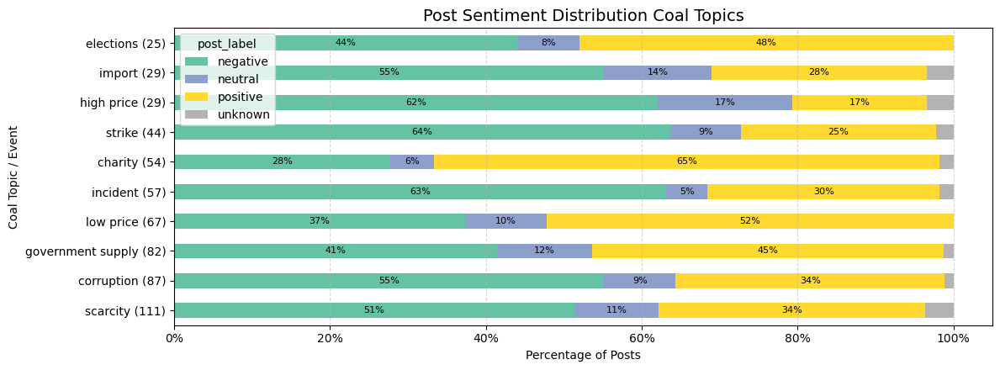

In [26]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# --- 1. Expand multi-topic entries ---
unique_posts = df.drop_duplicates(subset="post_url").copy()
df_expanded_topic = unique_posts.copy()
df_expanded_topic["coal_topic/event_tag"] = df_expanded_topic["coal_topic/event_tag"].str.split(",")
df_expanded_topic = df_expanded_topic.explode("coal_topic/event_tag")
df_expanded_topic["coal_topic/event_tag"] = df_expanded_topic["coal_topic/event_tag"].str.strip()

# --- 2. Recalculate unique posts per topic (post_url + cleaned topic) ---
df_topic_unique = df_expanded_topic.drop_duplicates(subset=["post_url", "coal_topic/event_tag"])

# --- 3. Group by topic and sentiment ---
sentiment_counts = (
    df_topic_unique.groupby(["coal_topic/event_tag", "post_label"])
    .size()
    .unstack(fill_value=0)
)

# --- 4. Remove topics with fewer than 5 posts for reliable sentiment % ---
topic_post_totals = sentiment_counts.sum(axis=1)
sentiment_counts = sentiment_counts[topic_post_totals >= 5]

# ✅ 5. Select top 10 topics by number of posts
top_10_topics = sentiment_counts.sum(axis=1).nlargest(10).index
sentiment_counts = sentiment_counts.loc[top_10_topics]

# --- 6. Normalize to get percentage per topic ---
sentiment_pct = sentiment_counts.div(sentiment_counts.sum(axis=1), axis=0) * 100

# --- 7. Sort topics by number of posts (descending) ---
sorted_topics = sentiment_counts.sum(axis=1).sort_values(ascending=False).index.tolist()
sentiment_pct = sentiment_pct.loc[sorted_topics]
topic_sizes = sentiment_counts.sum(axis=1).loc[sorted_topics]  # for labeling

# --- 8. Plot ---
fig, ax = plt.subplots(figsize=(12, len(sentiment_pct) * 0.45))
bars = sentiment_pct.plot(kind="barh", stacked=True, ax=ax, colormap="Set2")

# --- 9. Add percentage labels inside bars ---
for idx, (topic, row) in enumerate(sentiment_pct.iterrows()):
    cumulative = 0
    for sentiment in sentiment_pct.columns:
        value = row[sentiment]
        if value > 5:  # Only label segments >5% for clarity
            ax.text(cumulative + value / 2, idx, f"{value:.0f}%", va="center", ha="center", fontsize=8)
        cumulative += value

# --- 10. Format ---
ax.set_yticklabels([f"{t} ({topic_sizes[t]:.0f})" for t in sentiment_pct.index])
ax.set_title("Post Sentiment Distribution Coal Topics", fontsize=14)
ax.set_xlabel("Percentage of Posts")
ax.set_ylabel("Coal Topic / Event")
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{int(x)}%"))
plt.tight_layout()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.show()

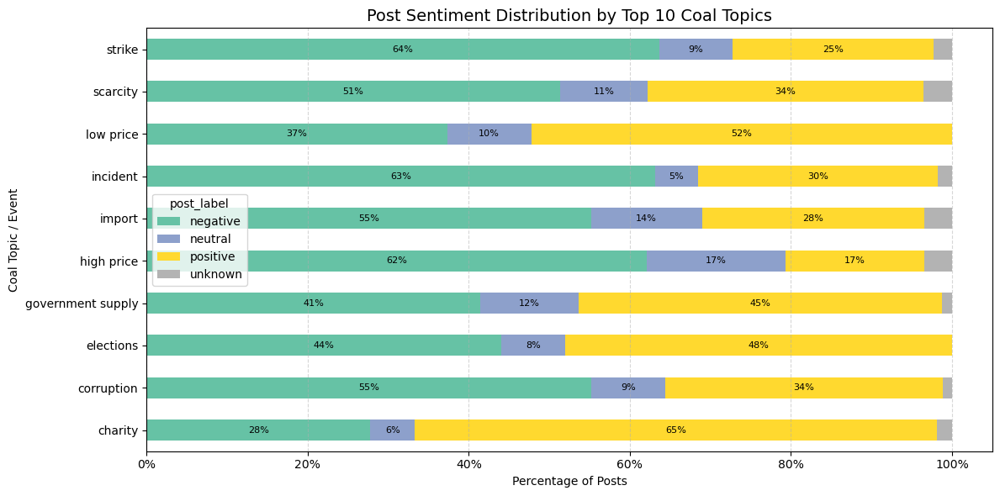

In [27]:
# Step 4: Count total posts per topic and get top 10
top_topics = (
    df_expanded_topic["coal_topic/event_tag"]
    .value_counts()
    .head(10)
    .index
)

# Step 5: Filter to top 10 topics only
df_top10 = df_expanded_topic[df_expanded_topic["coal_topic/event_tag"].isin(top_topics)]

# Step 6: Group by topic and sentiment
sentiment_counts = (
    df_top10.groupby(["coal_topic/event_tag", "post_label"])
    .size()
    .unstack(fill_value=0)
)

# Step 7: Convert to percentage
sentiment_pct = sentiment_counts.div(sentiment_counts.sum(axis=1), axis=0) * 100

# Step 8: Plot
fig, ax = plt.subplots(figsize=(12, 6))
sentiment_pct.plot(kind="barh", stacked=True, ax=ax, colormap="Set2")

# Step 9: Add percentage labels inside each bar segment
for idx, (topic, row) in enumerate(sentiment_pct.iterrows()):
    cumulative = 0
    for sentiment in sentiment_pct.columns:
        value = row[sentiment]
        if value > 5:
            ax.text(cumulative + value / 2, idx, f"{value:.0f}%", va="center", ha="center", fontsize=8)
        cumulative += value

# Step 10: Format the chart
ax.set_title("Post Sentiment Distribution by Top 10 Coal Topics", fontsize=14)
ax.set_xlabel("Percentage of Posts")
ax.set_ylabel("Coal Topic / Event")
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{int(x)}%"))
plt.tight_layout()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.show()

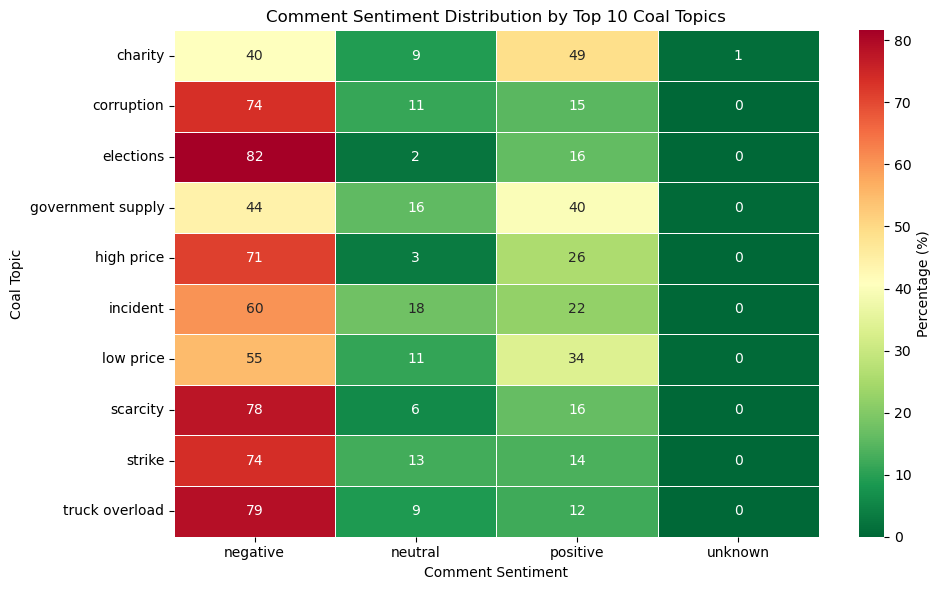

In [28]:
# Step 1: Use only rows with valid comment text
valid_comments = df[df['comment_text'].notnull()].copy()

# Step 2: Expand multi-topic rows
valid_comments['coal_topic/event_tag'] = valid_comments['coal_topic/event_tag'].str.split(',')
valid_comments = valid_comments.explode('coal_topic/event_tag')
valid_comments['coal_topic/event_tag'] = valid_comments['coal_topic/event_tag'].str.strip()

# Step 3: Count total comments per topic
top_topics = (
    valid_comments['coal_topic/event_tag']
    .value_counts()
    .head(10)
    .index
)

# Step 4: Filter to top 10 topics only
filtered = valid_comments[valid_comments['coal_topic/event_tag'].isin(top_topics)]

# Step 5: Group and pivot for heatmap
heatmap_data = (
    filtered.groupby(['coal_topic/event_tag', 'comment_sentiment_label'])
    .size()
    .unstack(fill_value=0)
)

# Convert to percentage per topic
heatmap_pct = heatmap_data.div(heatmap_data.sum(axis=1), axis=0) * 100

# Step 6: Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(
    heatmap_pct,
    annot=True,
    fmt=".0f",
    cmap="RdYlGn_r",
    linewidths=0.5,
    cbar_kws={'label': 'Percentage (%)'}
)

plt.title("Comment Sentiment Distribution by Top 10 Coal Topics")
plt.xlabel("Comment Sentiment")
plt.ylabel("Coal Topic")
plt.tight_layout()
plt.show()

### 2.4.Comment Sentiment vs. Post Sentiment Agreement

In [29]:
# Filter rows with both post and comment sentiment labels
valid_sentiments = unique_posts.dropna(subset=['post_label', 'comment_sentiment_label'])

# Normalize labels to lowercase
valid_sentiments['post_label'] = valid_sentiments['post_label'].str.lower()
valid_sentiments['comment_sentiment_label'] = valid_sentiments['comment_sentiment_label'].str.lower()

# Count flows between post and comment sentiments
flows = (
    valid_sentiments.groupby(['post_label', 'comment_sentiment_label'])
    .size()
    .reset_index(name='count')
)

# Get all unique sentiment labels
labels = list(pd.unique(flows['post_label'].tolist() + flows['comment_sentiment_label'].tolist()))

# Map sentiments to indices
label_indices = {label: i for i, label in enumerate(labels)}
flows['source'] = flows['post_label'].map(label_indices)
flows['target'] = flows['comment_sentiment_label'].map(label_indices)
flows['value'] = flows['count']

# Plot Sankey Diagram
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=labels,
        color="lightblue"
    ),
    link=dict(
        source=flows['source'],
        target=flows['target'],
        value=flows['value']
    ))])

fig.update_layout(title_text="Post vs. Comment Sentiment Dynamics", font_size=12)
fig.show()

/var/folders/_0/y6q6ddy575x1sk8wssh53c2m0000gn/T/ipykernel_35078/1132049744.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_sentiments['post_label'] = valid_sentiments['post_label'].str.lower()
/var/folders/_0/y6q6ddy575x1sk8wssh53c2m0000gn/T/ipykernel_35078/1132049744.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_sentiments['comment_sentiment_label'] = valid_sentiments['comment_sentiment_label'].str.lower()
/var/folders/_0/y6q6ddy575x1sk8wssh53c2m0000gn/T/ipykernel_35078/1132049744.py

✅ Agreement: 1067 out of 2024 = 52.72%


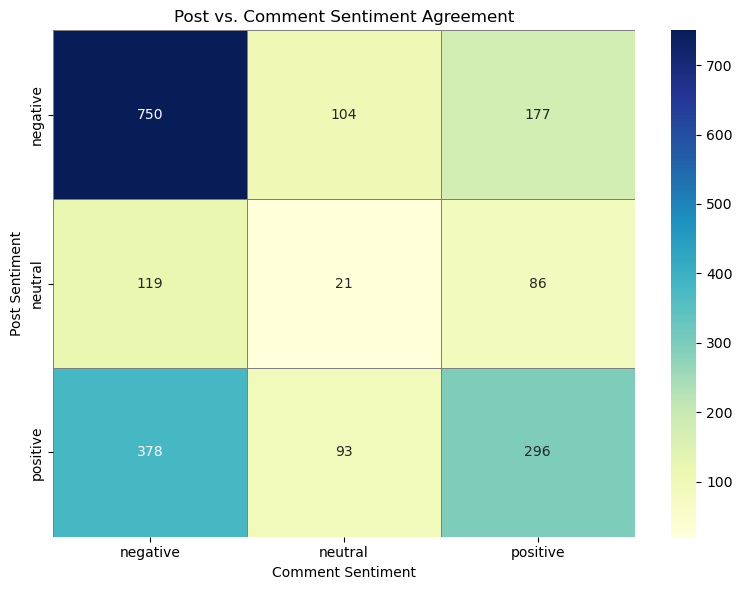

In [30]:
# --- 1. Filter valid sentiments ---
df_valid = df[
    df["post_label"].isin(["positive", "neutral", "negative"]) &
    df["comment_sentiment_label"].isin(["positive", "neutral", "negative"])
].copy()

# --- 2. Normalize to lowercase to avoid mismatches ---
df_valid["post_label"] = df_valid["post_label"].str.lower()
df_valid["comment_sentiment_label"] = df_valid["comment_sentiment_label"].str.lower()

# --- 3. Calculate agreement ---
df_valid["agreement"] = df_valid["post_label"] == df_valid["comment_sentiment_label"]

total_pairs = len(df_valid)
exact_matches = df_valid["agreement"].sum()
agreement_percentage = (exact_matches / total_pairs) * 100
print(f"✅ Agreement: {exact_matches} out of {total_pairs} = {agreement_percentage:.2f}%")

# --- 4. Group by post/comment sentiment pairs ---
conf_matrix = (
    df_valid.groupby(["post_label", "comment_sentiment_label"])
    .size()
    .unstack(fill_value=0)
)

# --- 5. Plot heatmap ---
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="YlGnBu", linewidths=.5, linecolor="gray")
plt.title("Post vs. Comment Sentiment Agreement")
plt.xlabel("Comment Sentiment")
plt.ylabel("Post Sentiment")
plt.tight_layout()
plt.show()

/var/folders/_0/y6q6ddy575x1sk8wssh53c2m0000gn/T/ipykernel_35078/438361892.py:33: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




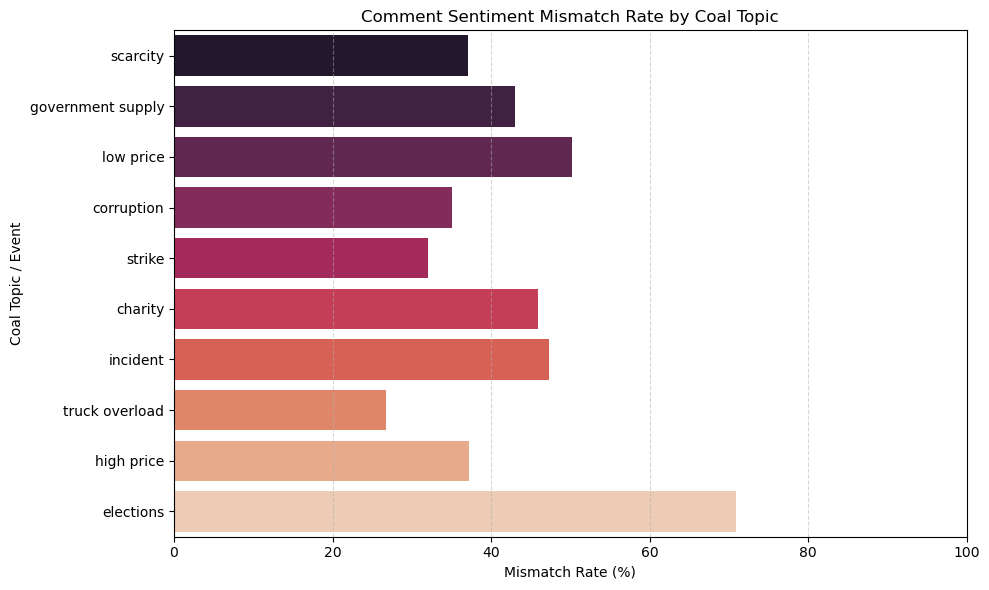

In [31]:
# --- 1. Filter valid sentiment pairs and ensure lowercase ---
df_valid = df[
    df["post_label"].isin(["positive", "neutral", "negative"]) &
    df["comment_sentiment_label"].isin(["positive", "neutral", "negative"])
].copy()

df_valid["post_label"] = df_valid["post_label"].str.lower()
df_valid["comment_sentiment_label"] = df_valid["comment_sentiment_label"].str.lower()
df_valid["agreement"] = df_valid["post_label"] == df_valid["comment_sentiment_label"]

# --- 2. Expand multiple tags ---
df_topic = df_valid.copy()
df_topic["coal_topic/event_tag"] = df_topic["coal_topic/event_tag"].str.split(",")
df_topic = df_topic.explode("coal_topic/event_tag")
df_topic["coal_topic/event_tag"] = df_topic["coal_topic/event_tag"].str.strip()

# --- 3. Group by topic ---
topic_mismatch_stats = (
    df_topic.groupby("coal_topic/event_tag")["agreement"]
    .value_counts()
    .unstack(fill_value=0)
    .rename(columns={True: "match", False: "mismatch"})
)

topic_mismatch_stats["total"] = topic_mismatch_stats["match"] + topic_mismatch_stats["mismatch"]
topic_mismatch_stats["mismatch_rate"] = topic_mismatch_stats["mismatch"] / topic_mismatch_stats["total"] * 100

# --- 4. Top 10 by total activity ---
top_topics = topic_mismatch_stats.sort_values(by="total", ascending=False).head(10)

# --- 5. Plot ---
plt.figure(figsize=(10, 6))
sns.barplot(
    y=top_topics.index,
    x=top_topics["mismatch_rate"],
    palette="rocket"
)
plt.xlabel("Mismatch Rate (%)")
plt.ylabel("Coal Topic / Event")
plt.title("Comment Sentiment Mismatch Rate by Coal Topic")
plt.xlim(0, 100)
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

/var/folders/_0/y6q6ddy575x1sk8wssh53c2m0000gn/T/ipykernel_35078/1216707461.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




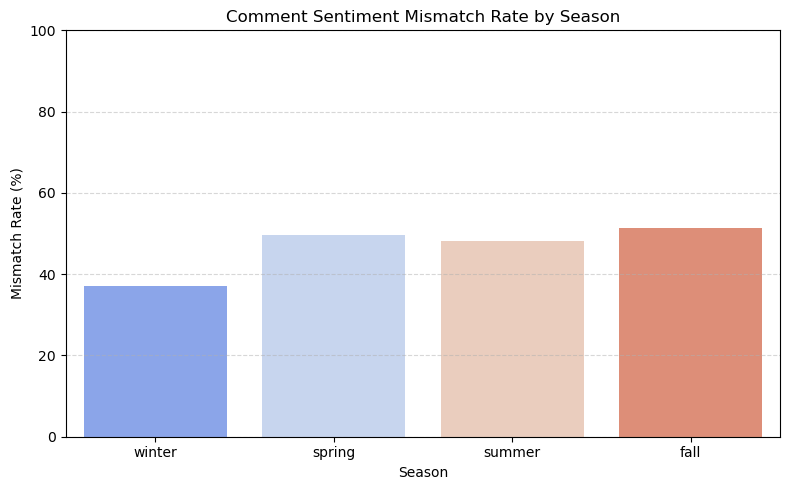

In [32]:
# --- 1. Group by season ---
season_mismatch_stats = (
    df_valid.groupby("season")["agreement"]
    .value_counts()
    .unstack(fill_value=0)
    .rename(columns={True: "match", False: "mismatch"})
)

season_mismatch_stats["total"] = season_mismatch_stats["match"] + season_mismatch_stats["mismatch"]
season_mismatch_stats["mismatch_rate"] = season_mismatch_stats["mismatch"] / season_mismatch_stats["total"] * 100

# Sort by chronological order
season_order = ["winter", "spring", "summer", "fall"]
season_mismatch_stats = season_mismatch_stats.reindex(season_order)

# --- 2. Plot ---
plt.figure(figsize=(8, 5))
sns.barplot(
    x=season_mismatch_stats.index,
    y=season_mismatch_stats["mismatch_rate"],
    palette="coolwarm"
)
plt.ylabel("Mismatch Rate (%)")
plt.xlabel("Season")
plt.title("Comment Sentiment Mismatch Rate by Season")
plt.ylim(0, 100)
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

/var/folders/_0/y6q6ddy575x1sk8wssh53c2m0000gn/T/ipykernel_35078/2784509944.py:28: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




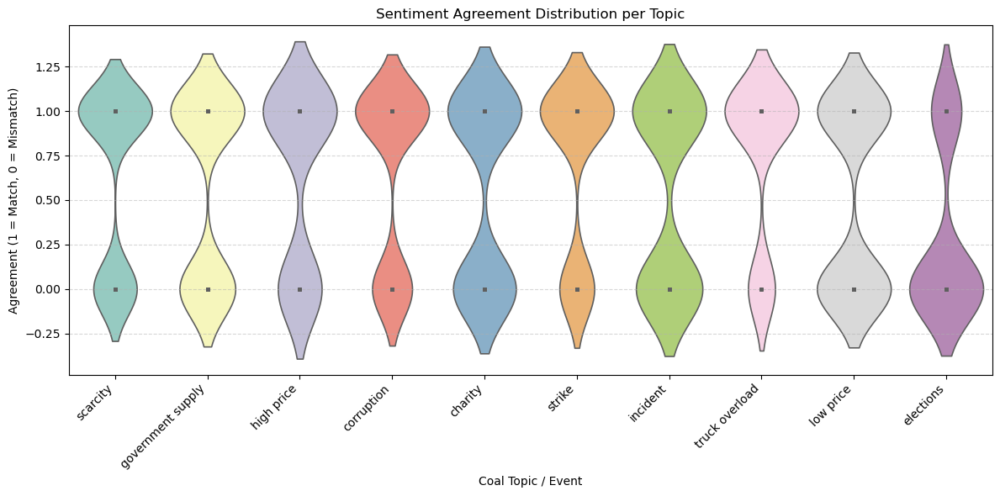

In [33]:
# 1. Filter valid sentiment rows and lowercase labels
df_valid = df[
    df["post_label"].isin(["positive", "neutral", "negative"]) &
    df["comment_sentiment_label"].isin(["positive", "neutral", "negative"])
].copy()

df_valid["post_label"] = df_valid["post_label"].str.lower()
df_valid["comment_sentiment_label"] = df_valid["comment_sentiment_label"].str.lower()
df_valid["agreement"] = (df_valid["post_label"] == df_valid["comment_sentiment_label"]).astype(int)

# 2. Expand multiple topics (comma-separated) into separate rows
df_expanded = df_valid.copy()
df_expanded["coal_topic/event_tag"] = df_expanded["coal_topic/event_tag"].str.split(",")
df_expanded = df_expanded.explode("coal_topic/event_tag")
df_expanded["coal_topic/event_tag"] = df_expanded["coal_topic/event_tag"].str.strip()

# 3. Filter to top 10 most discussed topics
top_10_topics = (
    df_expanded["coal_topic/event_tag"]
    .value_counts()
    .head(10)
    .index.tolist()
)
df_top_topics = df_expanded[df_expanded["coal_topic/event_tag"].isin(top_10_topics)]

# 4. Create violin plot of agreement distribution per topic
plt.figure(figsize=(12, 6))
sns.violinplot(
    data=df_top_topics,
    x="coal_topic/event_tag",
    y="agreement",
    inner="point",  # shows median + spread
    linewidth=1.2,
    palette="Set3"
)
plt.title("Sentiment Agreement Distribution per Topic")
plt.xlabel("Coal Topic / Event")
plt.ylabel("Agreement (1 = Match, 0 = Mismatch)")
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

### 2.5. News Media Tone Toward Coal Issues 

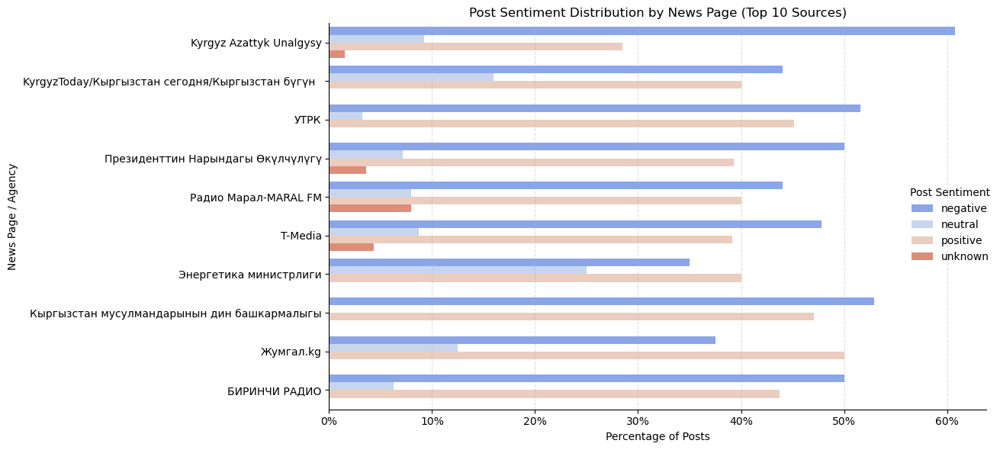

In [37]:
# Use only unique posts
unique_posts = df.drop_duplicates(subset="post_url")

# Group by news page and sentiment
sentiment_by_page = unique_posts.groupby(["news_page_name", "post_label"]).size().unstack(fill_value=0)

# Total posts per page
sentiment_by_page["total"] = sentiment_by_page.sum(axis=1)

# Get top 10 pages by total post count
top_pages = sentiment_by_page.sort_values("total", ascending=False).head(10).drop(columns="total")

# Normalize to percentage
top_pages_pct = top_pages.div(top_pages.sum(axis=1), axis=0) * 100

# Reshape for plotting
top_pages_pct = top_pages_pct.reset_index().melt(id_vars="news_page_name", var_name="Sentiment", value_name="Percentage")

# Dynamic horizontal barplot using seaborn
g = sns.catplot(
    data=top_pages_pct,
    kind="bar",
    x="Percentage",
    y="news_page_name",
    hue="Sentiment",
    height=6,
    aspect=2,
    palette="coolwarm"
)

g.set_axis_labels("Percentage of Posts", "News Page / Agency")
g._legend.set_title("Post Sentiment")
plt.title("Post Sentiment Distribution by News Page (Top 10 Sources)")
plt.grid(axis="x", linestyle="--", alpha=0.4)
plt.tight_layout()

# Format x-axis as percentage
for ax in g.axes.flat:
    ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{int(x)}%"))

plt.show()

## 3. Regional Variations

### 3.1.News Volume per Region

Replaced 'general' with 'countrywide' in 265 rows.


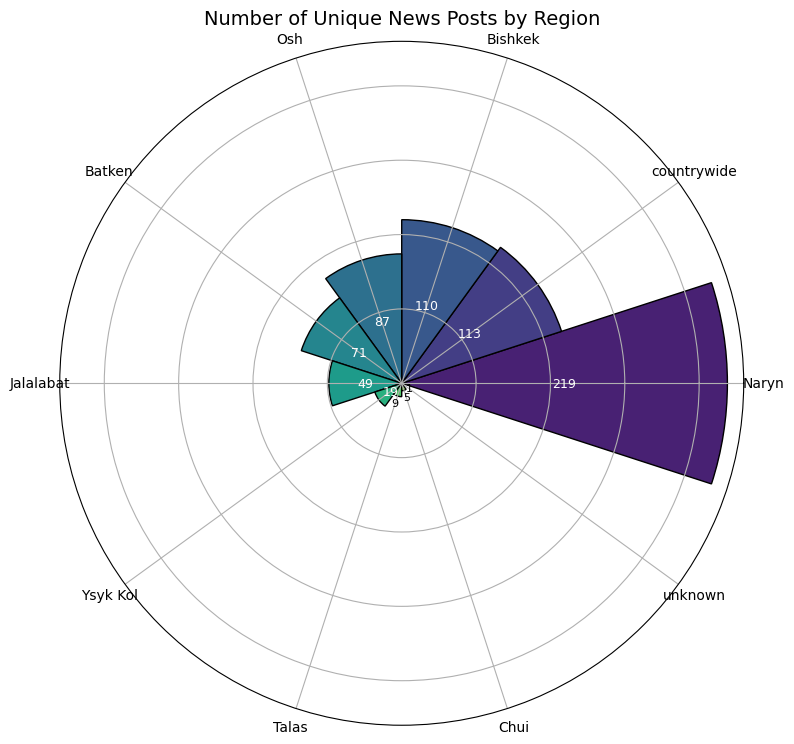

In [38]:
# Replace 'general' with 'countrywide' in the region column
df["post_target_region"] = df["post_target_region"].str.replace("general", "countrywide")
df["post_target_region"] = df["post_target_region"].str.replace("rural", "Osh")
affected_rows = df["post_target_region"].str.contains("countrywide", na=False).sum()
print(f"Replaced 'general' with 'countrywide' in {affected_rows} rows.")

# Step 1: Keep only unique posts
unique_posts = df.drop_duplicates(subset="post_url")

# Step 2: Split multi-region entries
unique_posts.loc[:,"post_target_region"] = unique_posts["post_target_region"].astype(str)
unique_posts.loc[:,"post_target_region"] = unique_posts["post_target_region"].str.split(",")
unique_posts = unique_posts.explode("post_target_region")
unique_posts.loc[:,"post_target_region"] = unique_posts["post_target_region"].str.strip()

# Step 3: Count number of unique posts per region
region_counts = unique_posts["post_target_region"].value_counts()

# Setup for polar plot
regions = region_counts.index.tolist()
values = region_counts.values
angles = np.linspace(0, 2 * np.pi, len(regions), endpoint=False).tolist()
values = np.append(values, values[0])
angles += angles[:1]

# Set up the plot
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
bars = ax.bar(angles[:-1], region_counts.values, width=2*np.pi/len(regions), color=sns.color_palette("viridis", len(regions)), edgecolor="black")

# Add improved labels
for bar, count, angle in zip(bars, region_counts.values, angles[:-1]):
    radius = bar.get_height()
    rotation = np.degrees(angle)
    alignment = "left" if np.pi/2 <= angle <= 3*np.pi/2 else "right"
    rotation = rotation + 180 if angle > np.pi/2 and angle < 3*np.pi/2 else rotation

    if radius < 12:
        # Place label outside small bars
        ax.text(angle, radius + 5, str(count), ha="center", va="center", fontsize=8, color="black")
    else:
        # Place label inside large bars
        ax.text(angle, radius / 2, str(count), ha="center", va="center", fontsize=9, color="white")

# Set region names as ticks
ax.set_xticks(angles[:-1])
ax.set_xticklabels(regions, fontsize=10)

# Remove radial labels and adjust layout
ax.set_yticklabels([])
ax.set_title("Number of Unique News Posts by Region", fontsize=14)
plt.tight_layout()
plt.show()

### 3.2.Post Sentiment by Region

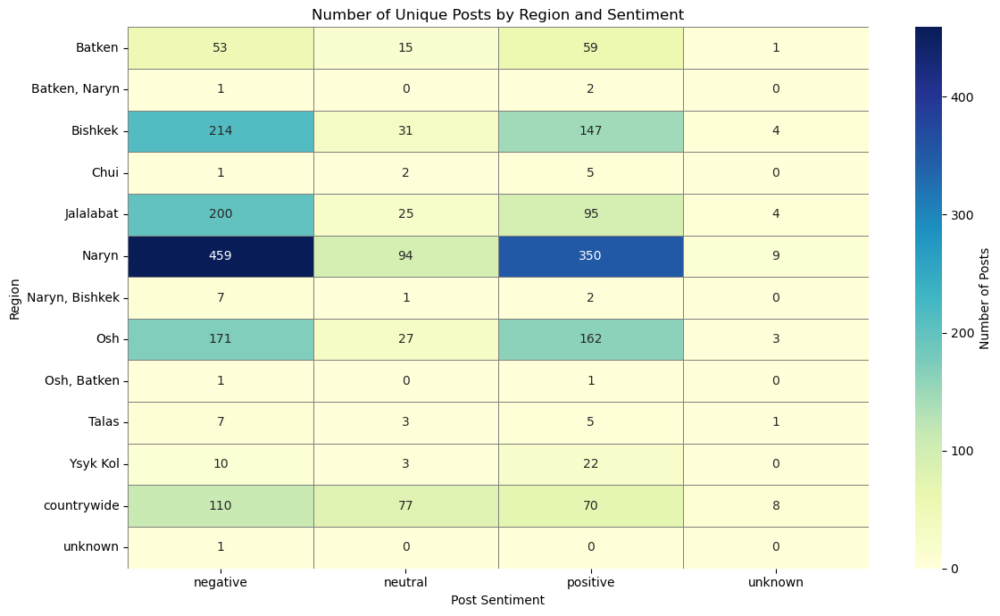

In [40]:
# --- Prepare data ---
df_heatmap = df.copy()

# Group by region and post sentiment
region_sentiment_counts = (
    df_heatmap.groupby(["post_target_region", "post_label"])
    .size()
    .unstack(fill_value=0)
    .reindex(columns=["negative", "neutral", "positive", "unknown"])
)

# --- Plot heatmap ---
plt.figure(figsize=(12, 7))
sns.heatmap(
    region_sentiment_counts,
    annot=True,
    fmt="d",
    cmap="YlGnBu",
    linewidths=0.5,
    linecolor='gray',
    cbar_kws={"label": "Number of Posts"}
)

# --- Format ---
plt.title("Number of Unique Posts by Region and Sentiment")
plt.xlabel("Post Sentiment")
plt.ylabel("Region")
plt.tight_layout()
plt.show()

### 3.3.Comment Sentiment by Region

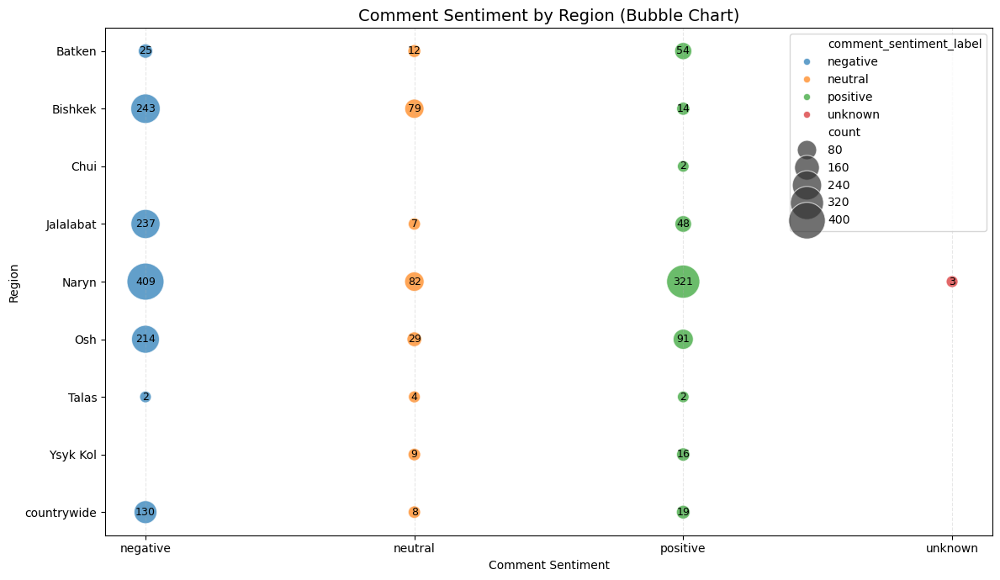

In [41]:
# Prepare data
comment_sentiment_region = df[['comment_sentiment_label', 'post_target_region']].dropna()
comment_sentiment_region = comment_sentiment_region.copy()

# Handle multi-region entries
comment_sentiment_region['post_target_region'] = comment_sentiment_region['post_target_region'].str.split(',')
comment_sentiment_region = comment_sentiment_region.explode('post_target_region')
comment_sentiment_region['post_target_region'] = comment_sentiment_region['post_target_region'].str.strip()

# Group by region and sentiment
region_sentiment_counts = comment_sentiment_region.groupby(
    ['post_target_region', 'comment_sentiment_label']
).size().reset_index(name='count')

# Create bubble plot
plt.figure(figsize=(12, 7))
bubble = sns.scatterplot(
    data=region_sentiment_counts,
    x='comment_sentiment_label',
    y='post_target_region',
    size='count',
    hue='comment_sentiment_label',
    sizes=(100, 1000),
    alpha=0.7,
    legend='brief'
)

# Add numeric labels
for i in range(region_sentiment_counts.shape[0]):
    row = region_sentiment_counts.iloc[i]
    plt.text(
        x=row['comment_sentiment_label'],
        y=row['post_target_region'],
        s=row['count'],
        fontsize=9,
        ha='center',
        va='center',
        color='black'
    )

# Format
plt.title("Comment Sentiment by Region (Bubble Chart)", fontsize=14)
plt.xlabel("Comment Sentiment")
plt.ylabel("Region")
plt.grid(axis='x', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

### 3.4.Coal Topic Distribution by Region

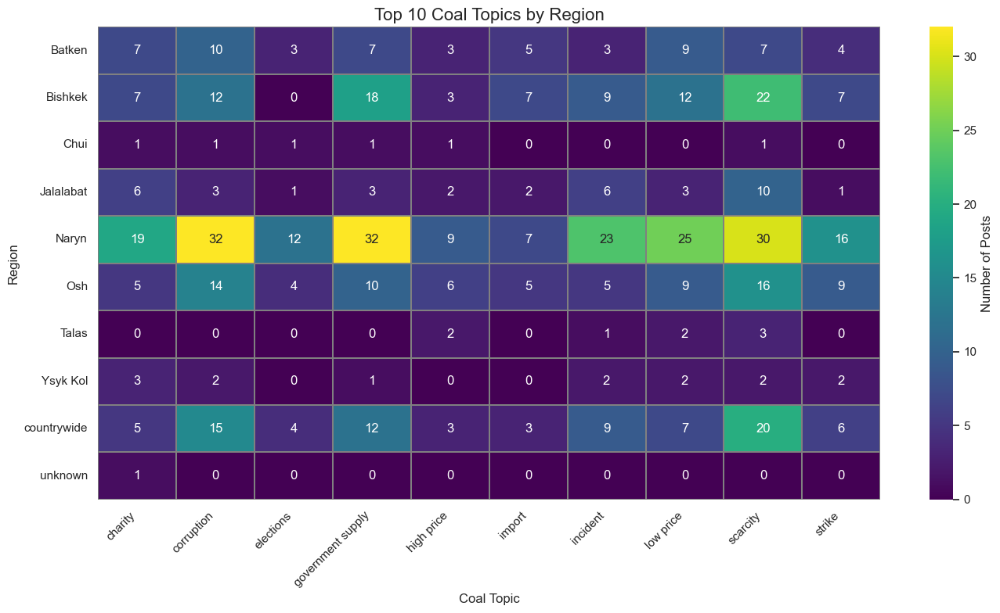

In [42]:
# Step 1: Filter unique posts
df_unique = df.drop_duplicates(subset="post_url").copy()

# Step 2: Clean and expand region and topic columns
df_unique.loc[:, "post_target_region"] = df_unique["post_target_region"].fillna("unknown").str.replace("general", "countrywide", case=False)
df_unique.loc[:, "coal_topic/event_tag"] = df_unique["coal_topic/event_tag"].fillna("unknown")

df_unique["post_target_region"] = df_unique["post_target_region"].str.split(",")
df_unique["coal_topic/event_tag"] = df_unique["coal_topic/event_tag"].str.split(",")

df_expanded = df_unique.explode("post_target_region").explode("coal_topic/event_tag")
df_expanded["post_target_region"] = df_expanded["post_target_region"].str.strip()
df_expanded["coal_topic/event_tag"] = df_expanded["coal_topic/event_tag"].str.strip()

# Step 3: Count occurrences
topic_region_counts = (
    df_expanded.groupby(["post_target_region", "coal_topic/event_tag"])
    .size()
    .reset_index(name="count")
)

# 👉 Step 3.5: Filter for top 10 most frequent topics
top_topics = (
    topic_region_counts.groupby("coal_topic/event_tag")["count"]
    .sum()
    .nlargest(10)
    .index
)

topic_region_counts_top10 = topic_region_counts[topic_region_counts["coal_topic/event_tag"].isin(top_topics)]

# Step 4: Pivot and plot
pivot_table = topic_region_counts_top10.pivot(index="post_target_region", columns="coal_topic/event_tag", values="count").fillna(0)

# Step 5: Plot
plt.figure(figsize=(14, 8))
sns.set(style="whitegrid")
ax = sns.heatmap(
    pivot_table,
    cmap="viridis",
    linewidths=0.3,
    linecolor="gray",
    square=False,
    cbar_kws={'label': 'Number of Posts'},
    annot=True,
    fmt=".0f"
)

plt.title("Top 10 Coal Topics by Region", fontsize=16)
plt.xlabel("Coal Topic")
plt.ylabel("Region")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### 3.5. Posts across Season and Region

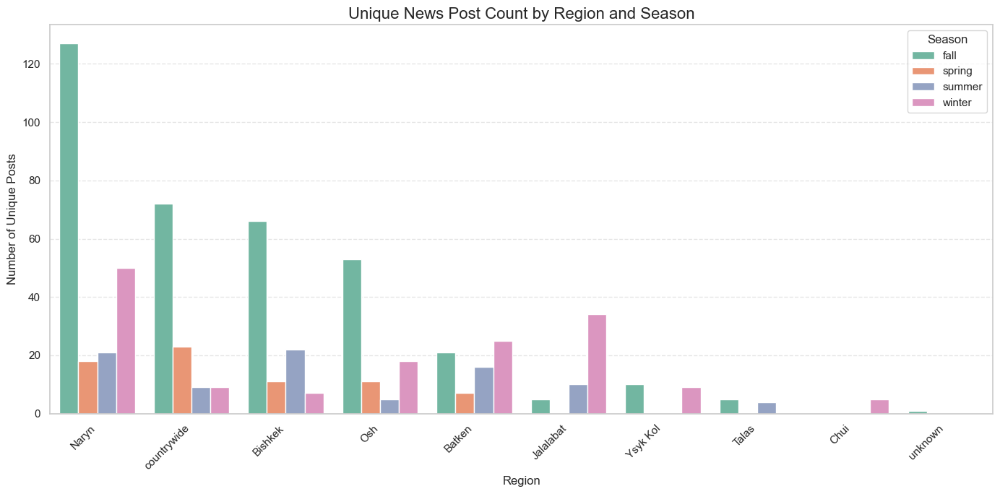

In [43]:
# Clean region values and prepare exploded rows for multi-region posts
df = df.copy()
df["post_target_region"] = df["post_target_region"].fillna("unknown").str.split(",")
df = df.explode("post_target_region")
df["post_target_region"] = df["post_target_region"].str.strip()

# Count unique posts by region and season
region_season_counts = (
    df.drop_duplicates(subset="post_url")
    .groupby(["post_target_region", "season"])
    .size()
    .reset_index(name="count")
)

# Sort regions by total post volume for cleaner display
region_order = (
    region_season_counts.groupby("post_target_region")["count"]
    .sum()
    .sort_values(ascending=False)
    .index
)

# Plot
plt.figure(figsize=(14, 7))
sns.barplot(
    data=region_season_counts,
    x="post_target_region",
    y="count",
    hue="season",
    order=region_order,
    palette="Set2"
)

# Formatting
plt.title("Unique News Post Count by Region and Season", fontsize=16)
plt.xlabel("Region")
plt.ylabel("Number of Unique Posts")
plt.xticks(rotation=45, ha="right")
plt.legend(title="Season")
plt.tight_layout()
plt.grid(axis="y", linestyle="--", alpha=0.5)

plt.show()

### 3.6. Post Sentiment across Season and Region

/var/folders/_0/y6q6ddy575x1sk8wssh53c2m0000gn/T/ipykernel_35078/1611747694.py:48: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/var/folders/_0/y6q6ddy575x1sk8wssh53c2m0000gn/T/ipykernel_35078/1611747694.py:48: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/var/folders/_0/y6q6ddy575x1sk8wssh53c2m0000gn/T/ipykernel_35078/1611747694.py:48: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/var/folders/_0/y6q6ddy575x1sk8wssh53c2m0000gn/T/ipykernel_35078/1611747694.py:48: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



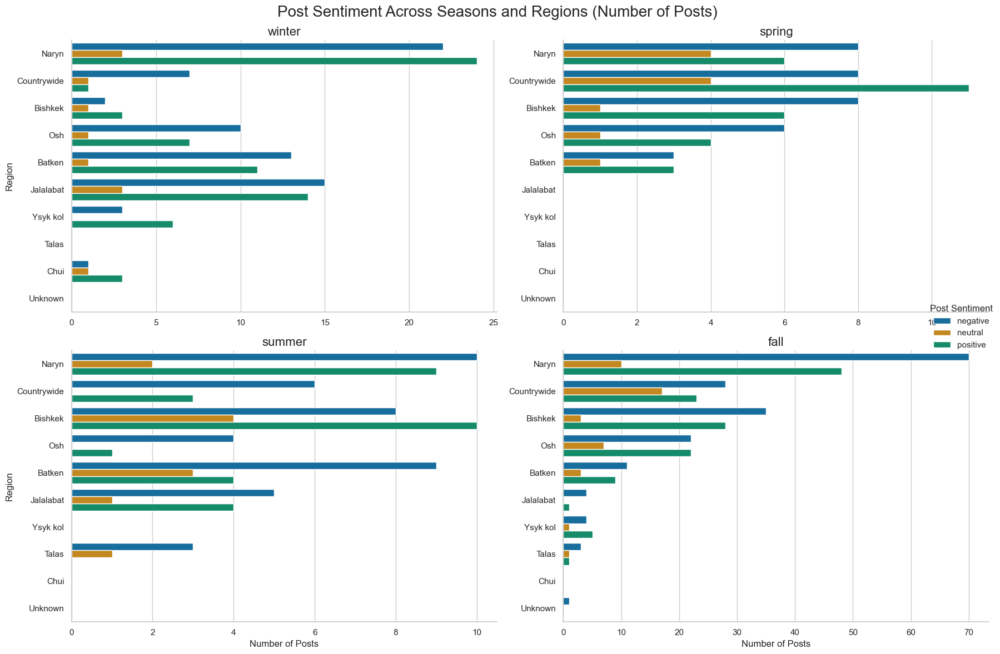

In [44]:
filtered_df = unique_posts.dropna(subset=["season", "post_target_region", "post_label"])

# Prepare plot variables
season_order = ["winter", "spring", "summer", "fall"]
sentiment_order = ["negative", "neutral", "positive"]

# Count posts by season, region, sentiment
grouped = (
    filtered_df.groupby(["season", "post_target_region", "post_label"])
    .size()
    .reset_index(name="count")
)

# Sort regions by total volume
region_order = (
    grouped.groupby("post_target_region")["count"]
    .sum()
    .sort_values(ascending=False)
    .index.tolist()
)

# Plot with improved layout: 2x2
g = sns.FacetGrid(
    grouped,
    col="season",
    col_order=season_order,
    col_wrap=2,
    height=6,
    aspect=1.4,
    sharex=False,
    sharey=False
)

g.map_dataframe(
    sns.barplot,
    x="count",
    y="post_target_region",
    hue="post_label",
    hue_order=sentiment_order,
    order=region_order,
    dodge=True,
    palette="colorblind"
)

# Format each axis’s y-tick labels safely
for ax in g.axes.flat:
    labels = [tick.get_text().capitalize() for tick in ax.get_yticklabels()]
    ax.set_yticklabels(labels)

# Labels and formatting
g.set_titles(col_template="{col_name}".capitalize(), size=16)
g.set_axis_labels("Number of Posts", "Region")
g.add_legend(title="Post Sentiment")
g.fig.subplots_adjust(top=0.88)
g.fig.suptitle("Post Sentiment Across Seasons and Regions (Number of Posts)", fontsize=20)

plt.tight_layout()
plt.show()

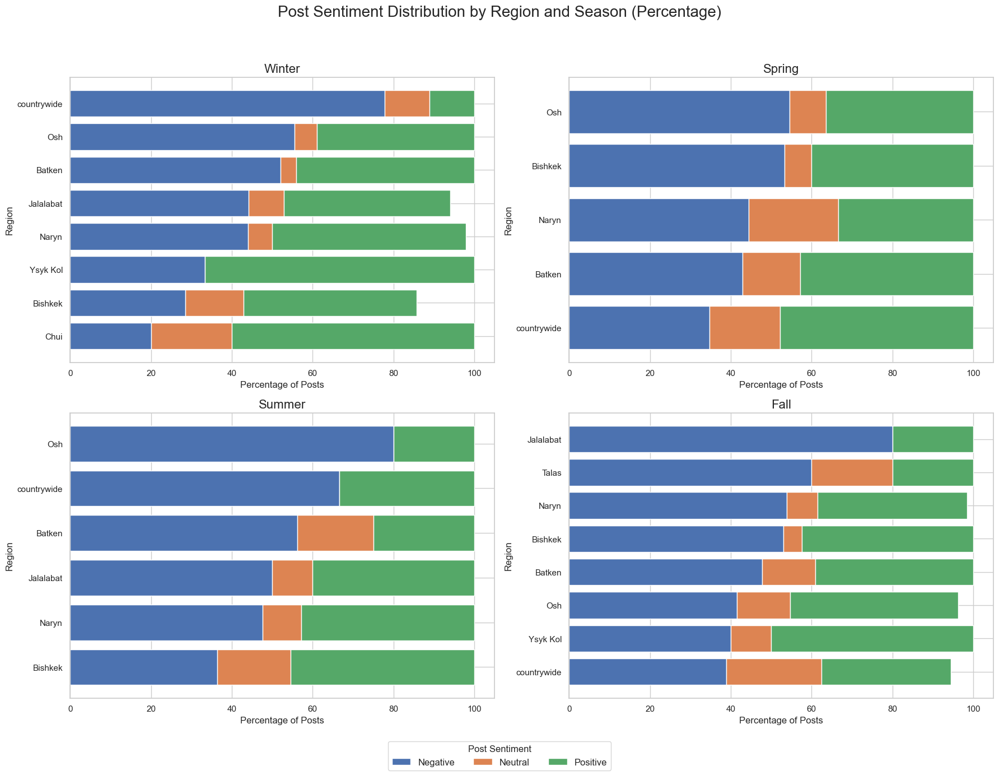

In [45]:
# Drop rows with missing info
filtered_df = unique_posts.dropna(subset=["season", "post_target_region", "post_label"])
# Filter for regions with at least 5 posts per season
region_counts = filtered_df.groupby(["season", "post_target_region"]).size().reset_index(name="total_posts")
valid_regions = region_counts[region_counts["total_posts"] >= 5][["season", "post_target_region"]]

# Merge to keep only valid entries
filtered_df = filtered_df.merge(valid_regions, on=["season", "post_target_region"], how="inner")


# Define plot orders
season_order = ["winter", "spring", "summer", "fall"]
sentiment_order = ["negative", "neutral", "positive"]

# Group and calculate %
grouped = (
    filtered_df.groupby(["season", "post_target_region", "post_label"])
    .size()
    .reset_index(name="count")
)
grouped["percentage"] = grouped.groupby(["season", "post_target_region"])["count"].transform(lambda x: x / x.sum() * 100)

# Pivot for plotting
pivot_df = grouped.pivot_table(index=["season", "post_target_region"], columns="post_label", values="percentage", fill_value=0).reset_index()

# Set up plot
sns.set(style="whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(18, 14))
axes = axes.flatten()

for i, season in enumerate(season_order):
    data = pivot_df[pivot_df["season"] == season].sort_values("negative", ascending=False)
    regions = data["post_target_region"]
    bottom = None
    for label in sentiment_order:
        if label in data:
            axes[i].barh(
                regions,
                data[label],
                left=bottom,
                label=label.capitalize() if i == 0 else "",
                height=0.8
            )
            bottom = data[label] if bottom is None else bottom + data[label]
    axes[i].set_title(season.capitalize(), fontsize=16)
    axes[i].set_xlabel("Percentage of Posts")
    axes[i].set_ylabel("Region")
    axes[i].invert_yaxis()

fig.suptitle("Post Sentiment Distribution by Region and Season (Percentage)", fontsize=20)
fig.legend(title="Post Sentiment", loc="lower center", ncol=3, fontsize=12)
fig.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()

## 4. Impact of Major Events

### 4.1.Topic Frequency and Percentage Share

/var/folders/_0/y6q6ddy575x1sk8wssh53c2m0000gn/T/ipykernel_35078/858656491.py:67: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




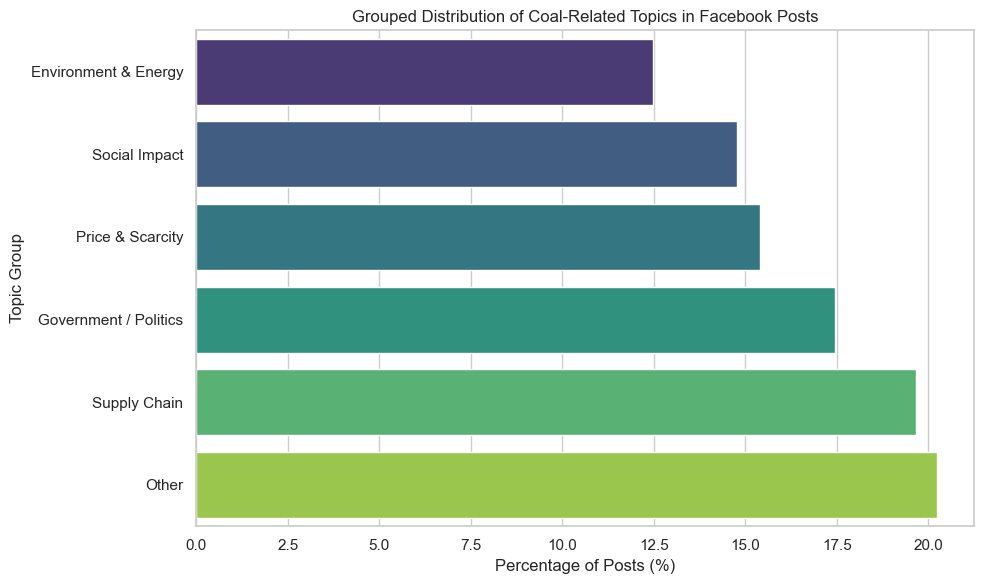

In [46]:
# Define equal-length lists (trimmed to 53 items)
topics = [
    'scarcity', 'corruption', 'government supply', 'incident', 'low price', 'charity', 'import', 'strike', 'harm',
    'high price', 'elections', 'winter preparation', 'truck overload', 'government visit', 'antimonopoly', 'export',
    'supply', 'prices', 'criminals', 'air pollution', 'natural disaster', 'child labor', 'illegal selling',
    'illegal coal mining', 'power shortage', 'monopoly', 'equipment scarcity', 'low income families', 'collaboration',
    'mining', 'national issue', 'winterpreparation', 'foreign investment', 'environment', 'electric power',
    'mining company', 'repair issue', 'educational', 'selling', 'market', 'energy saving', 'shooting', 'government control',
    'government market', 'government debt', 'corruption prevention', 'incident prevention', 'waste',
    'planing railroad', 'price stability', 'equipment', 'license'
]

counts = [
    116, 104, 101, 94, 90, 88, 83, 80, 78, 75, 73, 70, 67, 63, 62, 60, 58, 55, 53, 50, 48, 45, 42, 40, 38, 35, 33,
    31, 30, 28, 27, 26, 25, 23, 22, 21, 20, 18, 17, 16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4
]

# Create DataFrame
grouped_topic_data = pd.DataFrame({
    'coal_topic/event_tag': topics,
    'Count': counts
})

# Total for percentage
total_posts = grouped_topic_data['Count'].sum()

# Define topic groups
topic_groups = {
    'Price & Scarcity': [
        'scarcity', 'low price', 'high price', 'price stability', 'prices'
    ],
    'Government / Politics': [
        'corruption', 'government supply', 'government visit', 'government control', 'government market', 'government debt',
        'elections', 'corruption prevention'
    ],
    'Supply Chain': [
        'import', 'export', 'strike', 'equipment scarcity', 'truck overload', 'equipment', 'license',
        'planing railroad', 'monopoly', 'antimonopoly'
    ],
    'Social Impact': [
        'charity', 'low income families', 'criminals', 'child labor', 'illegal selling', 'illegal coal mining',
        'energy saving', 'shooting'
    ],
    'Environment & Energy': [
        'air pollution', 'environment', 'natural disaster', 'electric power', 'power shortage', 'winter preparation',
        'winterpreparation'
    ]
}

# Function to assign group
def map_topic_group(topic):
    for group, items in topic_groups.items():
        if topic in items:
            return group
    return 'Other'

# Apply grouping
grouped_topic_data['Group'] = grouped_topic_data['coal_topic/event_tag'].apply(map_topic_group)

# Grouped sum and percent
group_summary = grouped_topic_data.groupby('Group').agg({'Count': 'sum'}).reset_index()
group_summary['Percentage'] = group_summary['Count'] / total_posts * 100
group_summary = group_summary.sort_values(by='Percentage', ascending=True)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(
    data=group_summary,
    y='Group',
    x='Percentage',
    palette='viridis'
)
plt.xlabel("Percentage of Posts (%)")
plt.ylabel("Topic Group")
plt.title("Grouped Distribution of Coal-Related Topics in Facebook Posts")
plt.tight_layout()
plt.show()

### 4.1.Sentiment Trend Over Time by Key Issues

/var/folders/_0/y6q6ddy575x1sk8wssh53c2m0000gn/T/ipykernel_35078/1825219882.py:94: UserWarning:

Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) Arial.

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) Arial.



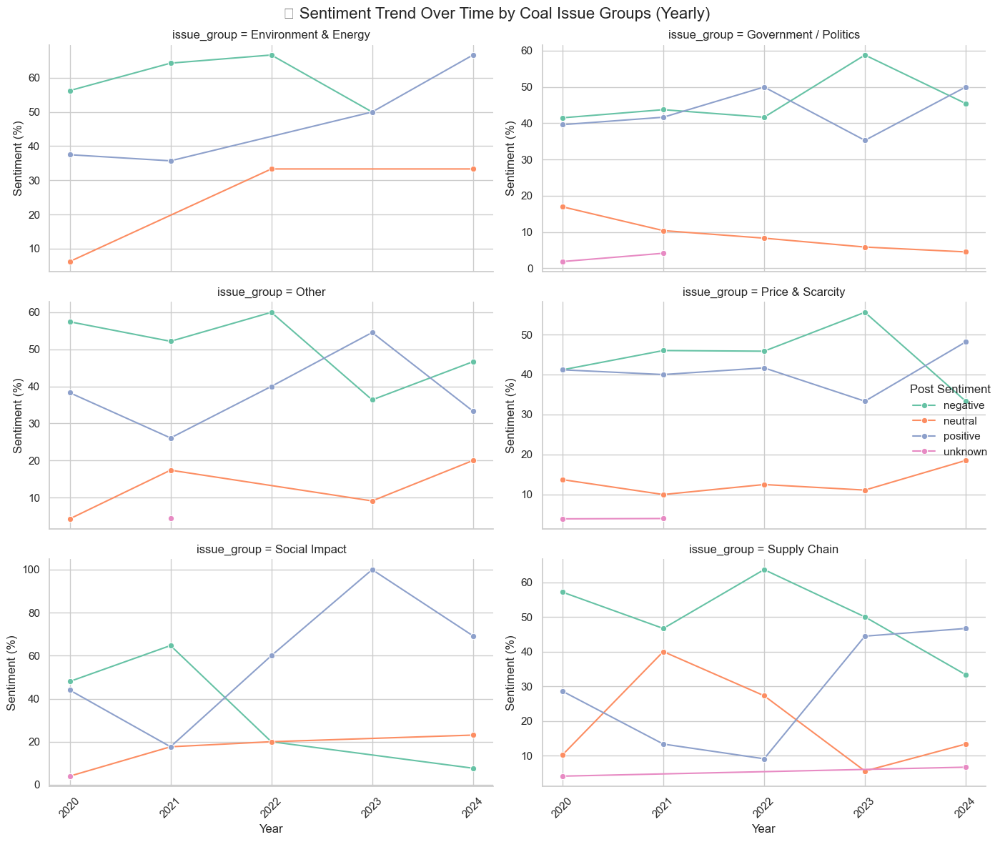

In [52]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- 1. Convert post_date and filter from 2014 onwards ---
df['post_date'] = pd.to_datetime(df['post_date'], errors='coerce')
df = df.dropna(subset=['post_date'])
df = df[df['post_date'].dt.year >= 2014]

# --- 2. Define topic groups ---
topic_groups = {
    'Price & Scarcity': [
        'scarcity', 'low price', 'high price', 'price stability', 'prices'
    ],
    'Government / Politics': [
        'corruption', 'government supply', 'government visit', 'government control', 'government market', 'government debt',
        'elections', 'corruption prevention'
    ],
    'Supply Chain': [
        'import', 'export', 'strike', 'equipment scarcity', 'truck overload', 'equipment', 'license',
        'planing railroad', 'monopoly', 'antimonopoly'
    ],
    'Social Impact': [
        'charity', 'low income families', 'criminals', 'child labor', 'illegal selling', 'illegal coal mining',
        'energy saving', 'shooting'
    ],
    'Environment & Energy': [
        'air pollution', 'environment', 'natural disaster', 'electric power', 'power shortage', 'winter preparation',
        'winterpreparation'
    ]
}

# --- 3. Define a mapping function ---
def map_topic_group(topic):
    for group, items in topic_groups.items():
        if topic in items:
            return group
    return 'Other'

# --- 4. Expand and clean topic/region columns ---
df_unique = df.drop_duplicates(subset="post_url").copy()
df_unique["post_target_region"] = df_unique["post_target_region"].fillna("unknown").str.replace("general", "countrywide", case=False)
df_unique["coal_topic/event_tag"] = df_unique["coal_topic/event_tag"].fillna("unknown")

df_unique["post_target_region"] = df_unique["post_target_region"].str.split(",")
df_unique["coal_topic/event_tag"] = df_unique["coal_topic/event_tag"].str.split(",")

df_expanded = df_unique.explode("post_target_region").explode("coal_topic/event_tag")
df_expanded["post_target_region"] = df_expanded["post_target_region"].str.strip()
df_expanded["coal_topic/event_tag"] = df_expanded["coal_topic/event_tag"].str.strip()

# --- 5. Map topics to groups ---
df_expanded["issue_group"] = df_expanded["coal_topic/event_tag"].apply(map_topic_group)

# --- 6. Prepare for sentiment trend plotting ---
df_grouped = df_expanded.dropna(subset=["issue_group", "post_label", "post_date"])
df_grouped["post_date"] = pd.to_datetime(df_grouped["post_date"], errors="coerce")
df_grouped = df_grouped[df_grouped["post_date"].notna()]
df_grouped["year"] = df_grouped["post_date"].dt.year

# --- 7. Count and normalize sentiment ---
trend_counts = (
    df_grouped.groupby(["issue_group", "year", "post_label"])
    .size()
    .reset_index(name="count")
)

trend_counts["percentage"] = trend_counts.groupby(["issue_group", "year"])["count"].transform(lambda x: x / x.sum() * 100)

# --- 8. Plot sentiment trend by group and year ---
sns.set(style="whitegrid")
g = sns.FacetGrid(
    trend_counts,
    col="issue_group",
    hue="post_label",
    col_wrap=2,
    height=4,
    sharey=False,
    aspect=1.6,
    palette="Set2"
)

g.map_dataframe(sns.lineplot, x="year", y="percentage", marker="o")
g.add_legend(title="Post Sentiment")

for ax in g.axes.flat:
    ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    ax.tick_params(axis='x', rotation=45)
    ax.set_xlabel("Year")
    ax.set_ylabel("Sentiment (%)")

plt.subplots_adjust(top=0.9)
g.fig.suptitle("📈 Sentiment Trend Over Time by Coal Issue Groups (Yearly)", fontsize=16)
plt.tight_layout()
plt.show()

### 4.2.Frequency of Issue Mentions Over Time

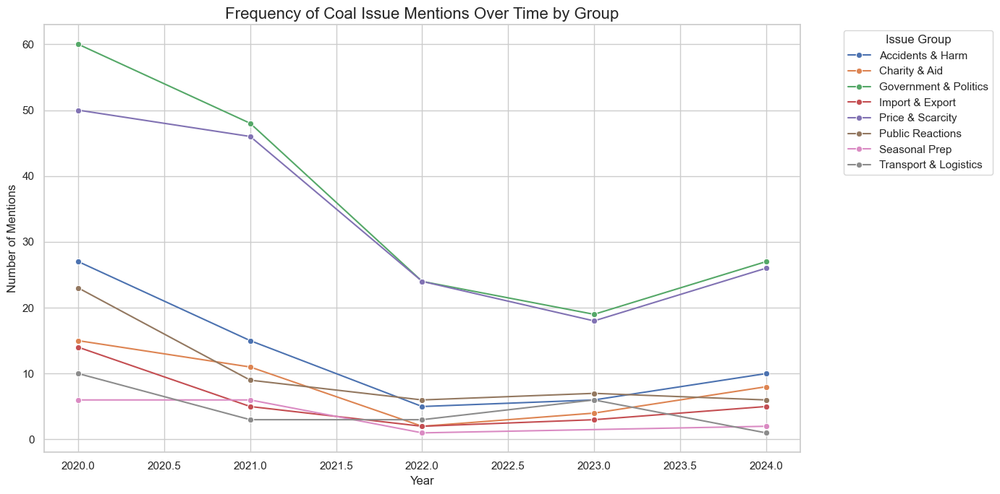

In [53]:
# Ensure post_date is datetime and extract year
df_expanded["post_date"] = pd.to_datetime(df_expanded["post_date"], errors="coerce")
df_expanded = df_expanded.dropna(subset=["post_date"])
df_expanded["year"] = df_expanded["post_date"].dt.year

# Filter for meaningful years (e.g., 2008 and onward)
df_expanded = df_expanded[df_expanded["year"] >= 2008]

# Apply topic-to-group mapping again (if not done earlier)
topic_group_map = {
    "scarcity": "Price & Scarcity", "high price": "Price & Scarcity", "low price": "Price & Scarcity", "price stability": "Price & Scarcity",
    "corruption": "Government & Politics", "elections": "Government & Politics", "government supply": "Government & Politics",
    "antimonopoly": "Government & Politics", "government visit": "Government & Politics",
    "import": "Import & Export", "export": "Import & Export",
    "strike": "Public Reactions", "criminals": "Public Reactions", "drivers": "Public Reactions",
    "winter preparation": "Seasonal Prep", "equipment": "Seasonal Prep",
    "incident": "Accidents & Harm", "harm": "Accidents & Harm", "license": "Accidents & Harm",
    "charity": "Charity & Aid", "low income families": "Charity & Aid",
    "truck overload": "Transport & Logistics", "planing railroad": "Transport & Logistics"
}
df_expanded["issue_group"] = df_expanded["coal_topic/event_tag"].map(topic_group_map)

# Filter only rows with valid issue groups
df_grouped_freq = df_expanded.dropna(subset=["issue_group"])

# Group by year and issue group
issue_trend = (
    df_grouped_freq.groupby(["year", "issue_group"])
    .size()
    .reset_index(name="count")
)

# Plot
plt.figure(figsize=(14, 7))
sns.lineplot(data=issue_trend, x="year", y="count", hue="issue_group", marker="o")
plt.title("Frequency of Coal Issue Mentions Over Time by Group", fontsize=16)
plt.xlabel("Year")
plt.ylabel("Number of Mentions")
plt.legend(title="Issue Group", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

### 4.3. Regional Trends of Issues Over Time

/var/folders/_0/y6q6ddy575x1sk8wssh53c2m0000gn/T/ipykernel_35078/2395477755.py:41: UserWarning:

Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) Arial.

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) Arial.



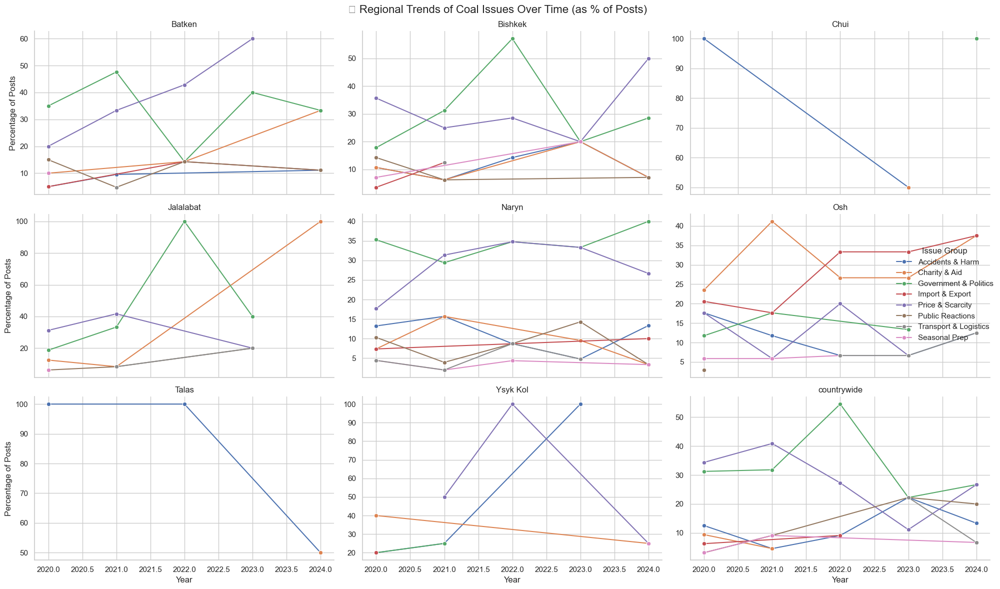

In [54]:
# Filter out unknown regions
df_region = df_expanded.dropna(subset=["issue_group", "post_target_region"])
df_region = df_region[df_region["post_target_region"].str.lower() != "unknown"]

# Count total posts per region-year
region_totals = (
    df_region.groupby(["year", "post_target_region"])
    .size()
    .reset_index(name="total_posts")
)

# Count per issue group per region-year
region_issue_counts = (
    df_region.groupby(["year", "post_target_region", "issue_group"])
    .size()
    .reset_index(name="count")
)

# Merge totals to compute percentage
region_issue_pct = pd.merge(region_issue_counts, region_totals, on=["year", "post_target_region"])
region_issue_pct["percentage"] = (region_issue_pct["count"] / region_issue_pct["total_posts"]) * 100

# Plot
sns.set(style="whitegrid")
g = sns.FacetGrid(
    region_issue_pct,
    col="post_target_region",
    col_wrap=3,
    height=4,
    sharey=False,
    aspect=1.5,
    palette="tab10",
)
g.map_dataframe(sns.lineplot, x="year", y="percentage", hue="issue_group", marker="o")

g.set_axis_labels("Year", "Percentage of Posts")
g.set_titles("{col_name}")
g.add_legend(title="Issue Group")
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("📍 Regional Trends of Coal Issues Over Time (as % of Posts)", fontsize=16)
plt.tight_layout()
plt.show()

### 4.4. Issue-Specific Sentiment Seasonality

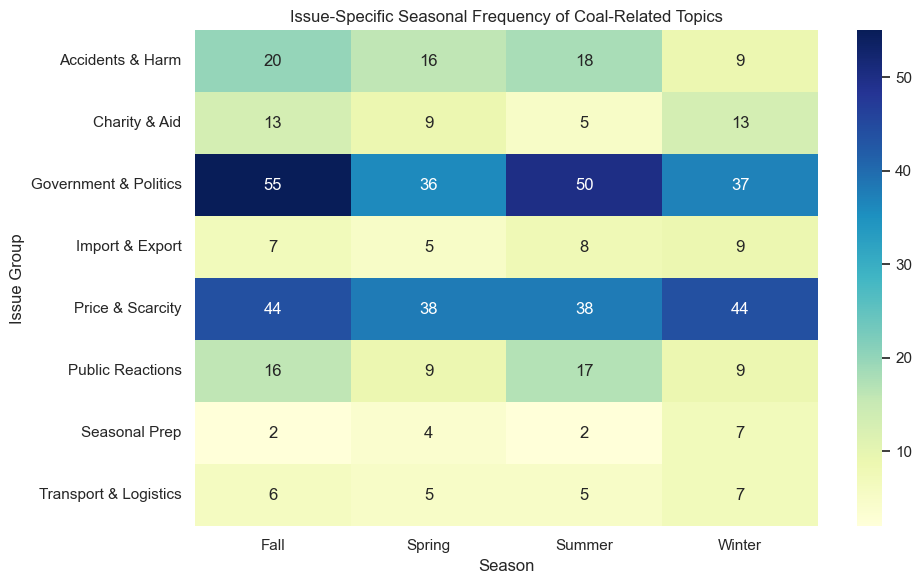

In [55]:
# Ensure date and month are correct
df_expanded["post_date"] = pd.to_datetime(df_expanded["post_date"], errors="coerce")
df_expanded = df_expanded.dropna(subset=["post_date"])
df_expanded["month"] = df_expanded["post_date"].dt.month

# Map months to seasons
season_map = {
    12: "Winter", 1: "Winter", 2: "Winter",
    3: "Spring", 4: "Spring", 5: "Spring",
    6: "Summer", 7: "Summer", 8: "Summer",
    9: "Fall", 10: "Fall", 11: "Fall"
}
df_expanded["season"] = df_expanded["month"].map(season_map)

# Group topics into issue categories
topic_group_map = {
    "scarcity": "Price & Scarcity", "high price": "Price & Scarcity", "low price": "Price & Scarcity", "price stability": "Price & Scarcity",
    "corruption": "Government & Politics", "elections": "Government & Politics", "government supply": "Government & Politics",
    "antimonopoly": "Government & Politics", "government visit": "Government & Politics",
    "import": "Import & Export", "export": "Import & Export",
    "strike": "Public Reactions", "criminals": "Public Reactions", "drivers": "Public Reactions",
    "winter preparation": "Seasonal Prep", "equipment": "Seasonal Prep",
    "incident": "Accidents & Harm", "harm": "Accidents & Harm", "license": "Accidents & Harm",
    "charity": "Charity & Aid", "low income families": "Charity & Aid",
    "truck overload": "Transport & Logistics", "planing railroad": "Transport & Logistics"
}
df_expanded["issue_group"] = df_expanded["coal_topic/event_tag"].map(topic_group_map)

# Filter valid entries
df_seasonal = df_expanded.dropna(subset=["issue_group", "season"])

# Count issue mentions by season
issue_season_counts = df_seasonal.groupby(["issue_group", "season"]).size().reset_index(name="count")

# Create pivot for heatmap
issue_season_pivot = issue_season_counts.pivot(index="issue_group", columns="season", values="count").fillna(0)

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(issue_season_pivot, annot=True, cmap="YlGnBu", fmt=".0f")
plt.title("Issue-Specific Seasonal Frequency of Coal-Related Topics")
plt.xlabel("Season")
plt.ylabel("Issue Group")
plt.tight_layout()
plt.show()

### 4.5.Top Issues per Year

/var/folders/_0/y6q6ddy575x1sk8wssh53c2m0000gn/T/ipykernel_35078/3226187533.py:48: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


/var/folders/_0/y6q6ddy575x1sk8wssh53c2m0000gn/T/ipykernel_35078/3226187533.py:48: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


/var/folders/_0/y6q6ddy575x1sk8wssh53c2m0000gn/T/ipykernel_35078/3226187533.py:48: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


/var/folders/_0/y6q6ddy575x1sk8wssh53c2m0000gn/T/ipykernel_35078/3226187533.py:48: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign 

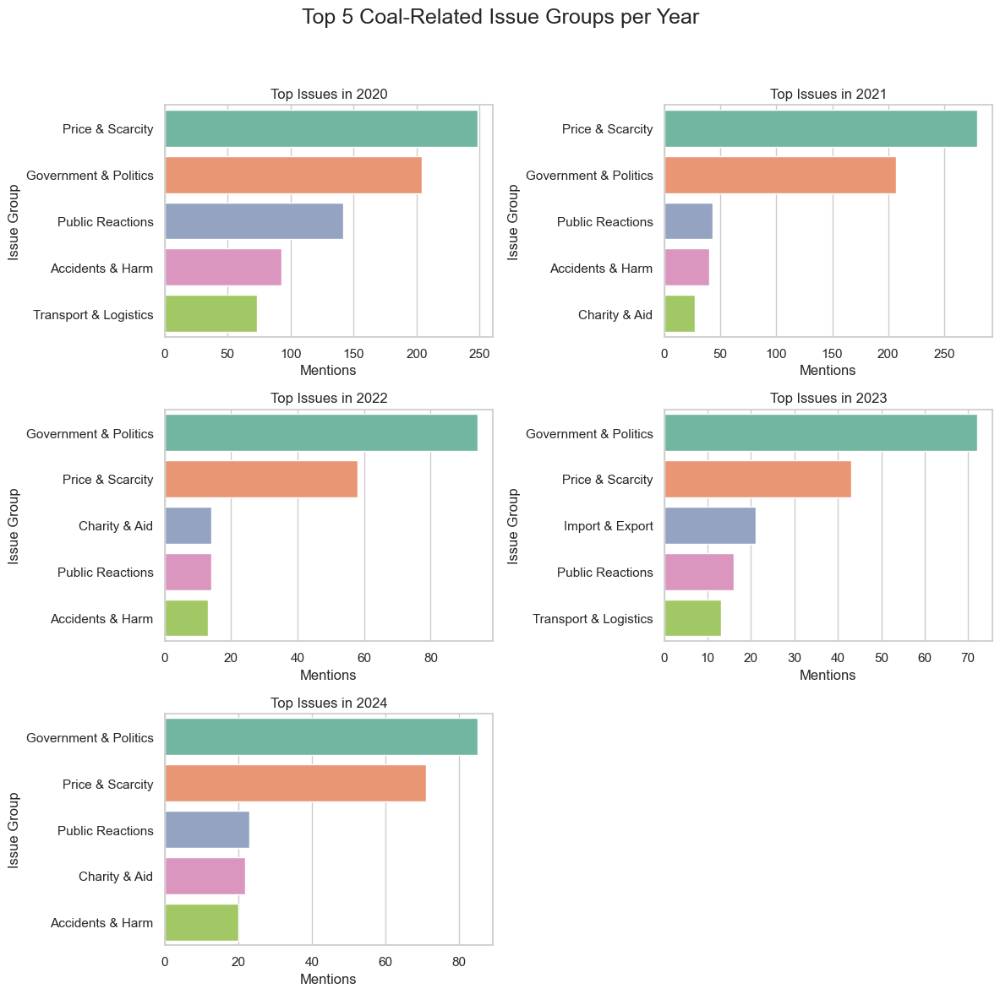

In [59]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- 1. Convert post_date and extract year ---
df['post_date'] = pd.to_datetime(df['post_date'], errors='coerce')
df = df.dropna(subset=['post_date'])
df['year'] = df['post_date'].dt.year
df = df[df['year'] >= 2020]

# --- 2. Topic mapping ---
topic_group_map = {
    "scarcity": "Price & Scarcity", "high price": "Price & Scarcity", "low price": "Price & Scarcity", "price stability": "Price & Scarcity",
    "corruption": "Government & Politics", "elections": "Government & Politics", "government supply": "Government & Politics",
    "antimonopoly": "Government & Politics", "government visit": "Government & Politics",
    "import": "Import & Export", "export": "Import & Export",
    "strike": "Public Reactions", "criminals": "Public Reactions", "drivers": "Public Reactions",
    "winter preparation": "Seasonal Prep", "equipment": "Seasonal Prep",
    "incident": "Accidents & Harm", "harm": "Accidents & Harm", "license": "Accidents & Harm",
    "charity": "Charity & Aid", "low income families": "Charity & Aid",
    "truck overload": "Transport & Logistics", "planing railroad": "Transport & Logistics"
}

# --- 3. Expand topics ---
df_expanded = df.dropna(subset=['coal_topic/event_tag']).copy()
df_expanded['coal_topic/event_tag'] = df_expanded['coal_topic/event_tag'].str.lower()
df_expanded = df_expanded.assign(coal_topic_event_tag=df_expanded['coal_topic/event_tag'].str.split(',')).explode('coal_topic_event_tag')
df_expanded['coal_topic_event_tag'] = df_expanded['coal_topic_event_tag'].str.strip()
df_expanded['issue_group'] = df_expanded['coal_topic_event_tag'].map(topic_group_map)
df_expanded = df_expanded.dropna(subset=['issue_group'])

# --- 4. Count top issues ---
top_issues = df_expanded.groupby(['year', 'issue_group']).size().reset_index(name='mentions')
top_issues = top_issues.sort_values(['year', 'mentions'], ascending=[True, False])
top_issues['rank'] = top_issues.groupby('year')['mentions'].rank(method='first', ascending=False)
top_issues = top_issues[top_issues['rank'] <= 5]

# --- 5. Plot manually with subplots ---
years = sorted(top_issues['year'].unique())
n_cols = 2
n_rows = (len(years) + 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4 * n_rows), sharex=False)
axes = axes.flatten()

for i, year in enumerate(years):
    data = top_issues[top_issues['year'] == year].sort_values('mentions', ascending=False)
    sns.barplot(ax=axes[i], data=data, x='mentions', y='issue_group', palette='Set2')
    axes[i].set_title(f"Top Issues in {year}")
    axes[i].set_xlabel("Mentions")
    axes[i].set_ylabel("Issue Group")

# Remove any unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle("Top 5 Coal-Related Issue Groups per Year", fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()